In [140]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import os
import matplotlib.pyplot as plt
import seaborn as sns

pd.options.display.max_columns = None


from sklearn.linear_model import *
from sklearn.model_selection import *
from sklearn.svm import *
from sklearn.ensemble import *
from sklearn.tree import *
from sklearn.naive_bayes import *
from sklearn.neighbors import *
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
# import zipfile
# with zipfile.ZipFile('track_1.zip', 'r') as zip_ref:
#     zip_ref.extractall('data')

In [3]:
# Путь к директории с данными

# data_dir = '/home/common/emergency_datahack/data_processed/track_1_package/track_1/'
data_dir = 'data'
os.listdir(data_dir)

['meteo_coord.csv',
 'reference_horiz_visib.csv',
 'reference_water_codes.csv',
 'test.csv',
 'train.csv',
 'hydro_1day.csv',
 'hydro_coord.csv',
 'ice_saw.csv',
 'meteo_1day.csv',
 'meteo_1month.csv']

In [4]:
# Загрузим всё
main_df = pd.read_csv(data_dir + '/train.csv')

# Метео
mc = pd.read_csv(data_dir + '/meteo_coord.csv')
mld = pd.read_csv(data_dir + '/meteo_1day.csv')
mlm = pd.read_csv(data_dir + '/meteo_1month.csv')
rhv = pd.read_csv(data_dir + '/reference_horiz_visib.csv')

# Гидро
hc = pd.read_csv(data_dir + '/hydro_coord.csv')
hld = pd.read_csv(data_dir + '/hydro_1day.csv',
                   parse_dates=['date'])
rwc = pd.read_csv(data_dir + '/reference_water_codes.csv')

In [5]:
main_df.head(1)

,year,station_id,day,ice_jam
0,2000,3019,1,0.0


In [6]:
main_df.shape

(11277, 4)

In [7]:
# Подтянем ближайшую к гидростанции метеостанцию

from geopy.distance import geodesic
import re

def merge_coord(df):
    df['lat_long'] = df[['lat', 'lon']].apply(tuple, axis=1)
    return df

def stat_km(point, stat_list):
    stations_list=stat_list
    lst=[]
    if pd.isnull(point):
        lst.append(np.nan)
    else:
        for i in stations_list['lat_long']:
            x=geodesic(point, i).km
            lst.append(x)
            stations_list['dist']=pd.DataFrame(lst)
        y=stations_list['station_id'][stations_list['dist'] == stations_list['dist'].min()]
        y=y.to_string()
        y=re.sub("^[0-9]+", "", y)
        y=re.sub(" +", "", y)
        return int(y)

hc = merge_coord(hc)
mc = merge_coord(mc)
hc['closest_hydro'] = mc.lat_long.apply(lambda x: stat_km(x, mc))

In [8]:
mld = mld.merge(hc[['station_id', 'closest_hydro']], left_on=['station_id'], 
                right_on='closest_hydro', how='right')
mld.drop(['station_id_x', 'closest_hydro', 'date'], axis=1, inplace=True)
mld.rename({'station_id_y': 'station_id'}, axis=1, inplace=True)

In [9]:
mld.shape

(237776, 46)

### Разделим годы на train и test сбалансированно по суммарной продолжительности заторных событий

In [10]:
# Суммарное количество заторов в году
jams_by_year = main_df.groupby('year').sum()['ice_jam'].to_frame().reset_index()
jams_by_year['ice_jam'].describe()

count    26.000000
mean      5.307692
std       3.792300
min       0.000000
25%       3.000000
50%       5.000000
75%       8.000000
max      16.000000
Name: ice_jam, dtype: float64

In [11]:
jams_by_year.shape

(26, 2)

In [12]:
# Разделим на бины по квартилям
bins = [-1, 3, 5, 8, 16]
jams_by_year['ice_jam_bins'] = pd.cut(jams_by_year['ice_jam'], bins)
X_length = jams_by_year[['year', 'ice_jam']]
y_length = jams_by_year['ice_jam_bins']
y_length.value_counts()

(-1, 3]    9
(3, 5]     7
(5, 8]     6
(8, 16]    4
Name: ice_jam_bins, dtype: int64

In [13]:
# Разделим годы на трейн и тест
X_train, X_test, y_train, y_test = train_test_split(X_length, 
                                                    y_length, 
                                                    test_size=0.3,  
                                                    stratify=y_length, 
                                                    random_state=42)

In [14]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(18, 2) (8, 2) (18,) (8,)


### Соберем фичи из гидроданных

In [15]:
main_df.head(1)

,year,station_id,day,ice_jam
0,2000,3019,1,0.0


In [16]:
hc.head(1)

,station_id,name,lat,lon,distance_from_source,drainage_area,z_null,lat_long,closest_hydro
0,3019,КИРЕНСК - Р.ЛЕНА,57.77,108.07,1140.0,92200,249.38,"(57.77, 108.07)",24538


<div class="alert alert-block alert-warning">
Мы не можем использовать данные из будущего: всё, что происходит после заторного периода, относится уже к следующему году.
</div>

In [17]:
# Внесем не темпоральные данные
main_df = pd.merge(main_df, hc[['station_id', 
                                'distance_from_source', 
                                'drainage_area', 
                                'z_null']], on='station_id', how='left')

# Возьмем также данные из ежедневных наблюдений
hld = pd.read_csv(data_dir + '/hydro_1day.csv',
                   parse_dates=['date'])
hld.head(1)

,year,station_id,month,day,date,stage_avg,stage_min,stage_max,temp,water_code,ice_thickness,snow_height,place,discharge
0,2000,3019,1,1,2000-01-01,74.0,74.0,74.0,NaN,46,NaN,NaN,NaN,NaN


In [18]:
main_df.head(1)

,year,station_id,day,ice_jam,distance_from_source,drainage_area,z_null
0,2000,3019,1,0.0,1140.0,92200,249.38


In [19]:
main_df.shape

(11277, 7)

In [20]:
hld['station_id'] = hld.station_id.astype(int)
mld['station_id'] = mld['station_id'].astype(int)

In [21]:
hld.head()

,year,station_id,month,day,date,stage_avg,stage_min,stage_max,temp,water_code,ice_thickness,snow_height,place,discharge
0,2000,3019,1,1,2000-01-01,74.0,74.0,74.0,NaN,46,NaN,NaN,NaN,NaN
1,2000,3019,1,2,2000-01-02,70.0,70.0,70.0,NaN,46,NaN,NaN,NaN,NaN
2,2000,3019,1,3,2000-01-03,67.0,67.0,67.0,NaN,46,NaN,NaN,NaN,NaN
3,2000,3019,1,4,2000-01-04,64.0,64.0,64.0,NaN,46,NaN,NaN,NaN,NaN
4,2000,3019,1,5,2000-01-05,60.0,60.0,60.0,NaN,46,NaN,NaN,NaN,NaN


In [22]:
mld.head()

,year,month,day,route_type,snow_coverage_near_station,snow_coverage_route,ice_crust_route,snow_height_aver,snow_height_max,snow_height_min,snow_density_aver,ice_crust_aver,snow_saturated_thickness,water_thickness,water_in_snow,water_total,snow_coverage_charact,snow_charact,snow_height,snow_coverage_station,snow_height_q1,snow_height_q2,snow_height_q3,temperature_20cm,temperature_20cm_qual,temperature_40cm,temperature_40cm_qual,temperature_80cm,temperature_80cm_qual,temperature_120cm,temperature_120cm_qual,temperature_160cm,temperature_160cm_qual,temperature_240cm,temperature_240cm_qual,temperature_320cm,temperature_320cm_qual,temperature_ks_5cm,temperature_ks_5cm_qual,temperature_ks_10cm,temperature_ks_10cm_qual,temperature_ks_15cm,temperature_ks_15cm_qual,temperature_ks_20cm,temperature_ks_20cm_qual,station_id
0,1985,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,10.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3019
1,1985,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,10.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3019
2,1985,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,10.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3019
3,1985,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,10.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3019
4,1985,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.0,10.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3019


In [23]:
hld.shape

(224848, 14)

In [24]:
mld.shape

(237776, 46)

In [25]:
hld = hld.merge(mld, on=['station_id', 'year', 'month', 'day'], how='inner')
hld = hld.fillna(0)
hld.head()

,year,station_id,month,day,date,stage_avg,stage_min,stage_max,temp,water_code,ice_thickness,snow_height_x,place,discharge,route_type,snow_coverage_near_station,snow_coverage_route,ice_crust_route,snow_height_aver,snow_height_max,snow_height_min,snow_density_aver,ice_crust_aver,snow_saturated_thickness,water_thickness,water_in_snow,water_total,snow_coverage_charact,snow_charact,snow_height_y,snow_coverage_station,snow_height_q1,snow_height_q2,snow_height_q3,temperature_20cm,temperature_20cm_qual,temperature_40cm,temperature_40cm_qual,temperature_80cm,temperature_80cm_qual,temperature_120cm,temperature_120cm_qual,temperature_160cm,temperature_160cm_qual,temperature_240cm,temperature_240cm_qual,temperature_320cm,temperature_320cm_qual,temperature_ks_5cm,temperature_ks_5cm_qual,temperature_ks_10cm,temperature_ks_10cm_qual,temperature_ks_15cm,temperature_ks_15cm_qual,temperature_ks_20cm,temperature_ks_20cm_qual
0,2000,3019,1,1,2000-01-01,74.0,74.0,74.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2000,3019,1,2,2000-01-02,70.0,70.0,70.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2000,3019,1,3,2000-01-03,67.0,67.0,67.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2000,3019,1,4,2000-01-04,64.0,64.0,64.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,45.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2000,3019,1,5,2000-01-05,60.0,60.0,60.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
hld.shape

(220433, 56)

### Скорректируем год, в который доступно наблюдение

In [27]:
# Определим для наблюдения год, в который оно доступно

# Маска-окно между заторным периодом и концом года
def after_jam_window(row, local=False):
    if local:
        month = row.month_local
        day = row.date_local.day
    else:
        month = row.month
        day = row.date.day
    return (((month == 6) and (day > 3))
            or (month in [7, 8, 9, 10, 11, 12]))

# Год относительно бизнес-логики
def target_year(row, local=False):
    if local:
        year = row.year_local
    else:
        year = row.year
    if after_jam_window(row):
        return year + 1
    else:
        return year
    
hld['target_year'] = hld.apply(target_year, axis=1)

# Календарный год и день больше не нужны
hld.drop(columns=['year', 'date', 'day'], axis=1, inplace=True)

In [28]:
hld.head(1)

,station_id,month,stage_avg,stage_min,stage_max,temp,water_code,ice_thickness,snow_height_x,place,discharge,route_type,snow_coverage_near_station,snow_coverage_route,ice_crust_route,snow_height_aver,snow_height_max,snow_height_min,snow_density_aver,ice_crust_aver,snow_saturated_thickness,water_thickness,water_in_snow,water_total,snow_coverage_charact,snow_charact,snow_height_y,snow_coverage_station,snow_height_q1,snow_height_q2,snow_height_q3,temperature_20cm,temperature_20cm_qual,temperature_40cm,temperature_40cm_qual,temperature_80cm,temperature_80cm_qual,temperature_120cm,temperature_120cm_qual,temperature_160cm,temperature_160cm_qual,temperature_240cm,temperature_240cm_qual,temperature_320cm,temperature_320cm_qual,temperature_ks_5cm,temperature_ks_5cm_qual,temperature_ks_10cm,temperature_ks_10cm_qual,temperature_ks_15cm,temperature_ks_15cm_qual,temperature_ks_20cm,temperature_ks_20cm_qual,target_year
0,3019,1,74.0,74.0,74.0,0.0,46,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,44.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000


In [29]:
# Гидро – сделаем ресэмплинг по месяцу

index = ['station_id', 'month', 'target_year']

hld_mean = hld.groupby(index).mean().add_prefix('mean_').reset_index()
hld_max = hld.groupby(index).max().add_prefix('max_').reset_index()
hld_min = hld.groupby(index).min().add_prefix('min_').reset_index()
hld_std = hld.groupby(index).std().add_prefix('std_').reset_index()
data_frames = [hld_mean, hld_max, hld_min, hld_std]

hydro_monthly = pd.concat(data_frames, axis=1)
hydro_monthly = hydro_monthly.loc[:,~hydro_monthly.columns.duplicated()]
hydro_monthly.sort_values(index).head()

,station_id,month,target_year,mean_stage_avg,mean_stage_min,mean_stage_max,mean_temp,mean_ice_thickness,mean_snow_height_x,mean_place,mean_discharge,mean_route_type,mean_snow_coverage_near_station,mean_snow_coverage_route,mean_ice_crust_route,mean_snow_height_aver,mean_snow_height_max,mean_snow_height_min,mean_snow_density_aver,mean_ice_crust_aver,mean_snow_saturated_thickness,mean_water_thickness,mean_water_in_snow,mean_water_total,mean_snow_coverage_charact,mean_snow_charact,mean_snow_height_y,mean_snow_coverage_station,mean_snow_height_q1,mean_snow_height_q2,mean_snow_height_q3,mean_temperature_20cm,mean_temperature_20cm_qual,mean_temperature_40cm,mean_temperature_40cm_qual,mean_temperature_80cm,mean_temperature_80cm_qual,mean_temperature_120cm,mean_temperature_120cm_qual,mean_temperature_160cm,mean_temperature_160cm_qual,mean_temperature_240cm,mean_temperature_240cm_qual,mean_temperature_320cm,mean_temperature_320cm_qual,mean_temperature_ks_5cm,mean_temperature_ks_5cm_qual,mean_temperature_ks_10cm,mean_temperature_ks_10cm_qual,mean_temperature_ks_15cm,mean_temperature_ks_15cm_qual,mean_temperature_ks_20cm,mean_temperature_ks_20cm_qual,max_stage_avg,max_stage_min,max_stage_max,max_temp,max_ice_thickness,max_snow_height_x,max_place,max_discharge,max_route_type,max_snow_coverage_near_station,max_snow_coverage_route,max_ice_crust_route,max_snow_height_aver,max_snow_height_max,max_snow_height_min,max_snow_density_aver,max_ice_crust_aver,max_snow_saturated_thickness,max_water_thickness,max_water_in_snow,max_water_total,max_snow_coverage_charact,max_snow_charact,max_snow_height_y,max_snow_coverage_station,max_snow_height_q1,max_snow_height_q2,max_snow_height_q3,max_temperature_20cm,max_temperature_20cm_qual,max_temperature_40cm,max_temperature_40cm_qual,max_temperature_80cm,max_temperature_80cm_qual,max_temperature_120cm,max_temperature_120cm_qual,max_temperature_160cm,max_temperature_160cm_qual,max_temperature_240cm,max_temperature_240cm_qual,max_temperature_320cm,max_temperature_320cm_qual,max_temperature_ks_5cm,max_temperature_ks_5cm_qual,max_temperature_ks_10cm,max_temperature_ks_10cm_qual,max_temperature_ks_15cm,max_temperature_ks_15cm_qual,max_temperature_ks_20cm,max_temperature_ks_20cm_qual,min_stage_avg,min_stage_min,min_stage_max,min_temp,min_ice_thickness,min_snow_height_x,min_place,min_discharge,min_route_type,min_snow_coverage_near_station,min_snow_coverage_route,min_ice_crust_route,min_snow_height_aver,min_snow_height_max,min_snow_height_min,min_snow_density_aver,min_ice_crust_aver,min_snow_saturated_thickness,min_water_thickness,min_water_in_snow,min_water_total,min_snow_coverage_charact,min_snow_charact,min_snow_height_y,min_snow_coverage_station,min_snow_height_q1,min_snow_height_q2,min_snow_height_q3,min_temperature_20cm,min_temperature_20cm_qual,min_temperature_40cm,min_temperature_40cm_qual,min_temperature_80cm,min_temperature_80cm_qual,min_temperature_120cm,min_temperature_120cm_qual,min_temperature_160cm,min_temperature_160cm_qual,min_temperature_240cm,min_temperature_240cm_qual,min_temperature_320cm,min_temperature_320cm_qual,min_temperature_ks_5cm,min_temperature_ks_5cm_qual,min_temperature_ks_10cm,min_temperature_ks_10cm_qual,min_temperature_ks_15cm,min_temperature_ks_15cm_qual,min_temperature_ks_20cm,min_temperature_ks_20cm_qual,std_stage_avg,std_stage_min,std_stage_max,std_temp,std_ice_thickness,std_snow_height_x,std_place,std_discharge,std_route_type,std_snow_coverage_near_station,std_snow_coverage_route,std_ice_crust_route,std_snow_height_aver,std_snow_height_max,std_snow_height_min,std_snow_density_aver,std_ice_crust_aver,std_snow_saturated_thickness,std_water_thickness,std_water_in_snow,std_water_total,std_snow_coverage_charact,std_snow_charact,std_snow_height_y,std_snow_coverage_station,std_snow_height_q1,std_snow_height_q2,std_snow_height_q3,std_temperature_20cm,std_temperature_20cm_qual,std_temperature_40cm,std_temperature_40cm_qual,std_temperature_80cm,std_temperature_80cm_qual,std_temperature_12

In [30]:
hydro_monthly.shape

(7750, 203)

In [31]:
def make_features(df):
    station, target_year = df.name
    result = pd.DataFrame()
    for month, mdf in df.groupby('month'):
        m_feats = mdf[df.columns[4:]].add_prefix(str(month) + '_').reset_index(drop=True)
        result = pd.concat([result, m_feats], axis=1)
    return result.reset_index(drop=True)
        
hydro_features = hydro_monthly.groupby(['station_id', 'target_year']).apply(make_features)
hydro_features = hydro_features.reset_index(level=2, drop=True).reset_index()
hydro_features.dropna(how='all', axis=1, inplace=True)
hydro_features

station_id  target_year  1_mean_stage_min  1_mean_stage_max  1_mean_temp  \
0          3019         1985        -25.709677        -25.580645          0.0   
1          3019         1986         56.000000         56.451613          0.0   
2          3019         1987          8.516129          9.161290          0.0   
3          3019         1988         28.516129         28.806452          0.0   
4          3019         1989         82.225806         82.774194          0.0   
..          ...          ...               ...               ...          ...   
915        3555         2016        248.225806        248.225806          0.0   
916        3555         2017        282.000000        282.000000          0.0   
917        3555         2018        251.354839        251.354839          0.0   
918        3555         2019        270.967742        270.967742          0.0   
919        3555         2020               NaN               NaN          NaN   

     1_mean_ice_thickness  1_mean_snow_height_x  1_mean_place  \
0               10.612903              6.709677      0.193548   
1                8.516129              5.774194      0.193548   
2                9.322581              3.580645      0.193548   
3                9.096774              5.290323      0.193548   
4                9.225806              7.774194      0.193548   
..                    ...                   ...           ...   
915              5.709677              4.548387      0.193548   
916              4.580645              3.806452      0.193548   
917              3.967742              3.806452      0.096774   
918              3.612903              2.419355      0.096774   
919                   NaN                   NaN           NaN   

     1_mean_discharge  1_mean_route_type  1_mean_snow_coverage_near_station  \
0                 0.0           0.000000                                0.0   
1                 0.0           0.000000                                0.0   
2                 0.0           0.000000                                0.0   
3                 0.0           0.000000                                0.0   
4                 0.0           0.000000                                0.0   
..                ...                ...                                ...   
915               0.0           0.193548                                0.0   
916               0.0           0.193548                                0.0   
917               0.0           0.193548                                0.0   
918               0.0           0.193548                                0.0   
919               NaN                NaN                                NaN   

     1_mean_snow_coverage_route  1_mean_ice_crust_route  \
0                      0.000000                     0.0   
1                      0.000000                     0.0   
2                      0.000000                     0.0   
3                      0.000000                     0.0   
4                      0.000000                     0.0   
..                          ...                     ...   
915                    0.967742                     0.0   
916                    0.967742                     0.0   
917                    0.967742                     0.0   
918                    0.967742                     0.0   
919                         NaN                     NaN   

     1_mean_snow_height_aver  1_mean_snow_height_max  1_mean_snow_height_min  \
0                   0.000000                0.000000                0.000000   
1                   0.000000                0.000000                0.000000   
2                   0.000000                0.000000                0.000000   
3                   0.000000                0.000000                0.000000   
4                   0.000000                0.000000                0.000000   
..                       ...                     ...                     ...   
915                 3.741935     

In [32]:
hydro_features.shape

(920, 1793)

In [33]:
hydro_features

station_id  target_year  1_mean_stage_min  1_mean_stage_max  1_mean_temp  \
0          3019         1985        -25.709677        -25.580645          0.0   
1          3019         1986         56.000000         56.451613          0.0   
2          3019         1987          8.516129          9.161290          0.0   
3          3019         1988         28.516129         28.806452          0.0   
4          3019         1989         82.225806         82.774194          0.0   
..          ...          ...               ...               ...          ...   
915        3555         2016        248.225806        248.225806          0.0   
916        3555         2017        282.000000        282.000000          0.0   
917        3555         2018        251.354839        251.354839          0.0   
918        3555         2019        270.967742        270.967742          0.0   
919        3555         2020               NaN               NaN          NaN   

     1_mean_ice_thickness  1_mean_snow_height_x  1_mean_place  \
0               10.612903              6.709677      0.193548   
1                8.516129              5.774194      0.193548   
2                9.322581              3.580645      0.193548   
3                9.096774              5.290323      0.193548   
4                9.225806              7.774194      0.193548   
..                    ...                   ...           ...   
915              5.709677              4.548387      0.193548   
916              4.580645              3.806452      0.193548   
917              3.967742              3.806452      0.096774   
918              3.612903              2.419355      0.096774   
919                   NaN                   NaN           NaN   

     1_mean_discharge  1_mean_route_type  1_mean_snow_coverage_near_station  \
0                 0.0           0.000000                                0.0   
1                 0.0           0.000000                                0.0   
2                 0.0           0.000000                                0.0   
3                 0.0           0.000000                                0.0   
4                 0.0           0.000000                                0.0   
..                ...                ...                                ...   
915               0.0           0.193548                                0.0   
916               0.0           0.193548                                0.0   
917               0.0           0.193548                                0.0   
918               0.0           0.193548                                0.0   
919               NaN                NaN                                NaN   

     1_mean_snow_coverage_route  1_mean_ice_crust_route  \
0                      0.000000                     0.0   
1                      0.000000                     0.0   
2                      0.000000                     0.0   
3                      0.000000                     0.0   
4                      0.000000                     0.0   
..                          ...                     ...   
915                    0.967742                     0.0   
916                    0.967742                     0.0   
917                    0.967742                     0.0   
918                    0.967742                     0.0   
919                         NaN                     NaN   

     1_mean_snow_height_aver  1_mean_snow_height_max  1_mean_snow_height_min  \
0                   0.000000                0.000000                0.000000   
1                   0.000000                0.000000                0.000000   
2                   0.000000                0.000000                0.000000   
3                   0.000000                0.000000                0.000000   
4                   0.000000                0.000000                0.000000   
..                       ...                     ...                     ...   
915                 3.741935     

### Соберем фичи в основной датасет

<div class="alert alert-block alert-success">
Важно: merge делаем по target_year.
</div>

In [34]:
main_df

,year,station_id,day,ice_jam,distance_from_source,drainage_area,z_null
0,2000,3019,1,0.0,1140.0,92200,249.38
1,2000,3019,2,0.0,1140.0,92200,249.38
2,2000,3019,3,0.0,1140.0,92200,249.38
3,2000,3019,4,0.0,1140.0,92200,249.38
4,2000,3019,5,0.0,1140.0,92200,249.38
...,...,...,...,...,...,...,...
11272,1999,3027,39,0.0,1575.0,199000,175.51
11273,1999,3027,40,0.0,1575.0,199000,175.51
11274,1999,3027,41,0.0,1575.0,199000,175.51
11275,1999,3027,42,0.0,1575.0,199000,175.51


In [35]:
main_df.shape

(11277, 7)

In [36]:
main_df = pd.merge(main_df, hydro_features, left_on=['year', 'station_id'],
                   right_on=['target_year', 'station_id'],
                   how='left')
cols = main_df.columns.to_list()
main_df = main_df[cols[:3] + [cols[7]] + cols[5:7] + cols[8:] + [cols[3]]]
main_df.dropna(how='any',inplace=True)
main_df.head(2)

,year,station_id,day,target_year,drainage_area,z_null,1_mean_stage_min,1_mean_stage_max,1_mean_temp,1_mean_ice_thickness,1_mean_snow_height_x,1_mean_place,1_mean_discharge,1_mean_route_type,1_mean_snow_coverage_near_station,1_mean_snow_coverage_route,1_mean_ice_crust_route,1_mean_snow_height_aver,1_mean_snow_height_max,1_mean_snow_height_min,1_mean_snow_density_aver,1_mean_ice_crust_aver,1_mean_snow_saturated_thickness,1_mean_water_thickness,1_mean_water_in_snow,1_mean_water_total,1_mean_snow_coverage_charact,1_mean_snow_charact,1_mean_snow_height_y,1_mean_snow_coverage_station,1_mean_snow_height_q1,1_mean_snow_height_q2,1_mean_snow_height_q3,1_mean_temperature_20cm,1_mean_temperature_20cm_qual,1_mean_temperature_40cm,1_mean_temperature_40cm_qual,1_mean_temperature_80cm,1_mean_temperature_80cm_qual,1_mean_temperature_120cm,1_mean_temperature_120cm_qual,1_mean_temperature_160cm,1_mean_temperature_160cm_qual,1_mean_temperature_240cm,1_mean_temperature_240cm_qual,1_mean_temperature_320cm,1_mean_temperature_320cm_qual,1_mean_temperature_ks_5cm,1_mean_temperature_ks_5cm_qual,1_mean_temperature_ks_10cm,1_mean_temperature_ks_10cm_qual,1_mean_temperature_ks_15cm,1_mean_temperature_ks_15cm_qual,1_mean_temperature_ks_20cm,1_mean_temperature_ks_20cm_qual,1_max_stage_avg,1_max_stage_min,1_max_stage_max,1_max_temp,1_max_ice_thickness,1_max_snow_height_x,1_max_place,1_max_discharge,1_max_route_type,1_max_snow_coverage_near_station,1_max_snow_coverage_route,1_max_ice_crust_route,1_max_snow_height_aver,1_max_snow_height_max,1_max_snow_height_min,1_max_snow_density_aver,1_max_ice_crust_aver,1_max_snow_saturated_thickness,1_max_water_thickness,1_max_water_in_snow,1_max_water_total,1_max_snow_coverage_charact,1_max_snow_charact,1_max_snow_height_y,1_max_snow_coverage_station,1_max_snow_height_q1,1_max_snow_height_q2,1_max_snow_height_q3,1_max_temperature_20cm,1_max_temperature_20cm_qual,1_max_temperature_40cm,1_max_temperature_40cm_qual,1_max_temperature_80cm,1_max_temperature_80cm_qual,1_max_temperature_120cm,1_max_temperature_120cm_qual,1_max_temperature_160cm,1_max_temperature_160cm_qual,1_max_temperature_240cm,1_max_temperature_240cm_qual,1_max_temperature_320cm,1_max_temperature_320cm_qual,1_max_temperature_ks_5cm,1_max_temperature_ks_5cm_qual,1_max_temperature_ks_10cm,1_max_temperature_ks_10cm_qual,1_max_temperature_ks_15cm,1_max_temperature_ks_15cm_qual,1_max_temperature_ks_20cm,1_max_temperature_ks_20cm_qual,1_min_stage_avg,1_min_stage_min,1_min_stage_max,1_min_temp,1_min_ice_thickness,1_min_snow_height_x,1_min_place,1_min_discharge,1_min_route_type,1_min_snow_coverage_near_station,1_min_snow_coverage_route,1_min_ice_crust_route,1_min_snow_height_aver,1_min_snow_height_max,1_min_snow_height_min,1_min_snow_density_aver,1_min_ice_crust_aver,1_min_snow_saturated_thickness,1_min_water_thickness,1_min_water_in_snow,1_min_water_total,1_min_snow_coverage_charact,1_min_snow_charact,1_min_snow_height_y,1_min_snow_coverage_station,1_min_snow_height_q1,1_min_snow_height_q2,1_min_snow_height_q3,1_min_temperature_20cm,1_min_temperature_20cm_qual,1_min_temperature_40cm,1_min_temperature_40cm_qual,1_min_temperature_80cm,1_min_temperature_80cm_qual,1_min_temperature_120cm,1_min_temperature_120cm_qual,1_min_temperature_160cm,1_min_temperature_160cm_qual,1_min_temperature_240cm,1_min_temperature_240cm_qual,1_min_temperature_320cm,1_min_temperature_320cm_qual,1_min_temperature_ks_5cm,1_min_temperature_ks_5cm_qual,1_min_temperature_ks_10cm,1_min_temperature_ks_10cm_qual,1_min_temperature_ks_15cm,1_min_temperature_ks_15cm_qual,1_min_temperature_ks_20cm,1_min_temperature_ks_20cm_qual,1_std_stage_avg,1_std_stage_min,1_std_stage_max,1_std_temp,1_std_ice_thickness,1_std_snow_height_x,1_std_place,1_std_discharge,1_std_route_type,1_std_snow_coverage_near_station,1_std_snow_coverage_route,1_std_ice_crust_route,1_std_snow_height_aver,1_std_snow_height_max,1_std_snow_height_min,1_std_snow_density_aver,1_std_ice_crust_aver,1_std_snow_saturated_thickness,1_std_water_th

### Нормируем фичи

In [37]:
from sklearn.preprocessing import StandardScaler

ids, data, target = main_df[main_df.columns[:4]], main_df[main_df.columns[4:-1]], main_df[main_df.columns[-1]]

scaler = StandardScaler()
scaler.fit(data)
transformed_data = scaler.transform(data)
norm_df = pd.concat([ids, pd.DataFrame(transformed_data, columns = main_df.columns[4:-1]), target], axis=1)
norm_df

year  station_id   day  target_year  drainage_area    z_null  \
0      2000.0      3019.0   1.0       2000.0      -1.250208  2.027005   
1      2000.0      3019.0   2.0       2000.0      -1.250208  2.027005   
2      2000.0      3019.0   3.0       2000.0      -1.250208  2.027005   
3      2000.0      3019.0   4.0       2000.0      -1.250208  2.027005   
4      2000.0      3019.0   5.0       2000.0      -1.250208  2.027005   
...       ...         ...   ...          ...            ...       ...   
11272  1999.0      3027.0  39.0       1999.0            NaN       NaN   
11273  1999.0      3027.0  40.0       1999.0            NaN       NaN   
11274  1999.0      3027.0  41.0       1999.0            NaN       NaN   
11275  1999.0      3027.0  42.0       1999.0            NaN       NaN   
11276  1999.0      3027.0  43.0       1999.0            NaN       NaN   

       1_mean_stage_min  1_mean_stage_max  1_mean_temp  1_mean_ice_thickness  \
0             -0.273503         -0.273754          0.0             -0.851962   
1             -0.273503         -0.273754          0.0             -0.851962   
2             -0.273503         -0.273754          0.0             -0.851962   
3             -0.273503         -0.273754          0.0             -0.851962   
4             -0.273503         -0.273754          0.0             -0.851962   
...                 ...               ...          ...                   ...   
11272               NaN               NaN          NaN                   NaN   
11273               NaN               NaN          NaN                   NaN   
11274               NaN               NaN          NaN                   NaN   
11275               NaN               NaN          NaN                   NaN   
11276               NaN               NaN          NaN                   NaN   

       1_mean_snow_height_x  1_mean_place  1_mean_discharge  \
0                  0.208741     -0.296448         -0.337384   
1                  0.208741     -0.296448         -0.337384   
2                  0.208741     -0.296448         -0.337384   
3                  0.208741     -0.296448         -0.337384   
4                  0.208741     -0.296448         -0.337384   
...                     ...           ...               ...   
11272                   NaN           NaN               NaN   
11273                   NaN           NaN               NaN   
11274                   NaN           NaN               NaN   
11275                   NaN           NaN               NaN   
11276                   NaN           NaN               NaN   

       1_mean_route_type  1_mean_snow_coverage_near_station  \
0               -1.25214                           -0.33743   
1               -1.25214                           -0.33743   
2               -1.25214                           -0.33743   
3               -1.25214                           -0.33743   
4               -1.25214                           -0.33743   
...                  ...                                ...   
11272                NaN                                NaN   
11273                NaN                                NaN   
11274                NaN                                NaN   
11275                NaN                                NaN   
11276                NaN                                NaN   

       1_mean_snow_coverage_route  1_mean_ice_crust_route  \
0                       -1.231207                     0.0   
1                       -1.231207                     0.0   
2                       -1.231207                     0.0   
3                       -1.231207                     0.0   
4                       -1.231207                     0.0   
...                           ...                     ...   
11272                         NaN                     NaN   
11273                         NaN                     NaN   
11274                         NaN                     NaN   
11275                         NaN              

In [38]:
# Разделим на трейн и тест исходя из target_year

test = norm_df[~norm_df.target_year.isin(X_train.year.to_list())].reset_index(drop=True).dropna()
train = norm_df[norm_df.target_year.isin(X_train.year.to_list())].reset_index(drop=True).dropna()

# target_year больше не нужна

test.drop(columns=['target_year'], inplace=True)
train.drop(columns=['target_year'], inplace=True)

In [39]:
train.shape

(6116, 1797)

In [40]:
# Поделим данные на предикторы и таргет

X_train, y_train = train.iloc[:, :-1], train.ice_jam
X_test, y_test = test.iloc[:, :-1], test.ice_jam

In [41]:
X_train

year  station_id   day  drainage_area    z_null  1_mean_stage_min  \
0     2000.0      3019.0   1.0      -1.250208  2.027005         -0.273503   
1     2000.0      3019.0   2.0      -1.250208  2.027005         -0.273503   
2     2000.0      3019.0   3.0      -1.250208  2.027005         -0.273503   
3     2000.0      3019.0   4.0      -1.250208  2.027005         -0.273503   
4     2000.0      3019.0   5.0      -1.250208  2.027005         -0.273503   
...      ...         ...   ...            ...       ...               ...   
6111  1992.0      3035.0  40.0      -1.004878  0.712382         -0.094826   
6112  1992.0      3035.0  41.0      -1.004878  0.712382         -0.094826   
6113  1992.0      3035.0  42.0      -1.004878  0.712382         -0.094826   
6114  1992.0      3035.0  43.0      -1.004878  0.712382         -0.094826   
6115  1992.0      3035.0  44.0      -1.004878  0.712382         -0.094826   

      1_mean_stage_max  1_mean_temp  1_mean_ice_thickness  \
0            -0.273754          0.0             -0.851962   
1            -0.273754          0.0             -0.851962   
2            -0.273754          0.0             -0.851962   
3            -0.273754          0.0             -0.851962   
4            -0.273754          0.0             -0.851962   
...                ...          ...                   ...   
6111         -0.095067          0.0             -1.246775   
6112         -0.095067          0.0             -1.246775   
6113         -0.095067          0.0             -1.246775   
6114         -0.095067          0.0             -1.246775   
6115         -0.095067          0.0             -1.246775   

      1_mean_snow_height_x  1_mean_place  1_mean_discharge  1_mean_route_type  \
0                 0.208741     -0.296448         -0.337384          -1.252140   
1                 0.208741     -0.296448         -0.337384          -1.252140   
2                 0.208741     -0.296448         -0.337384          -1.252140   
3                 0.208741     -0.296448         -0.337384          -1.252140   
4                 0.208741     -0.296448         -0.337384          -1.252140   
...                    ...           ...               ...                ...   
6111             -0.686197     -0.296448         -0.337384           1.068065   
6112             -0.686197     -0.296448         -0.337384           1.068065   
6113             -0.686197     -0.296448         -0.337384           1.068065   
6114             -0.686197     -0.296448         -0.337384           1.068065   
6115             -0.686197     -0.296448         -0.337384           1.068065   

      1_mean_snow_coverage_near_station  1_mean_snow_coverage_route  \
0                              -0.33743                   -1.231207   
1                              -0.33743                   -1.231207   
2                              -0.33743                   -1.231207   
3                              -0.33743                   -1.231207   
4                              -0.33743                   -1.231207   
...                                 ...                         ...   
6111                           -0.33743                    0.605226   
6112                           -0.33743                    0.605226   
6113                           -0.33743                    0.605226   
6114                           -0.33743                    0.605226   
6115                           -0.33743                    0.605226   

      1_mean_ice_crust_route  1_mean_snow_height_aver  1_mean_snow_height_max  \
0                        0.0                -1.035231               -1.042948   
1                        0.0                -1.035231               -1.042948   
2                        0.0                -1.035231               -1.042948   
3                        0.0                -1.035231               -1.042948   
4                        0.0                -1.035231               -1.042948   
...                      ...          

In [170]:
X_train.to_csv('X_train.csv')
y_train.to_csv('y_train.csv')
X_test.to_csv('X_test.csv')
y_test.to_csv('y_test.csv')

### Обучим простой классификатор

In [12]:
from sklearn.svm import SVC
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

In [43]:
# from sklearn.svm import LinearSVC
# from sklearn.feature_selection import RFE
# from sklearn.linear_model import LogisticRegression
# # lsvc = SVC(C=0.01, penalty="l1", dual=False).fit(X_train, y_train)
# selector = RFE(LogisticRegression(max_iter=5000),
#                n_features_to_select=200, step=10).fit(X_train, y_train)
# X_reduced = selector.transform(X_train)
# X_reduced_test = selector.transform(X_test)
# X_reduced.shape

KeyboardInterrupt: 

In [45]:
from sklearn.manifold import TSNE

In [52]:
pca = PCA()
# tsne = TSNE()
parameters = {'pca__n_components': list(range(400,500,50)), 'svc__kernel':('linear', 'rbf'), 'svc__C':[1,10]}
clf = Pipeline([('pca', pca), ('svc', SVC(class_weight='balanced'))])
# clf = Pipeline([('tsne', tsne), ('svc', SVC(class_weight='balanced'))])
GS = GridSearchCV(clf, parameters, scoring='f1_macro', verbose=10)

In [53]:
GS.fit(X_train, y_train)
print(GS.cv_results_)
print(GS.best_params_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] pca__n_components=400, svc__C=1, svc__kernel=linear .............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  pca__n_components=400, svc__C=1, svc__kernel=linear, score=0.463, total=   8.3s
[CV] pca__n_components=400, svc__C=1, svc__kernel=linear .............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.3s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=linear, score=0.266, total=   6.5s
[CV] pca__n_components=400, svc__C=1, svc__kernel=linear .............


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   14.8s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=linear, score=0.285, total=   8.1s
[CV] pca__n_components=400, svc__C=1, svc__kernel=linear .............


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   22.8s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=linear, score=0.354, total=   7.0s
[CV] pca__n_components=400, svc__C=1, svc__kernel=linear .............


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   29.8s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=linear, score=0.406, total=   8.1s
[CV] pca__n_components=400, svc__C=1, svc__kernel=rbf ................


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   37.9s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=rbf, score=0.441, total=   8.6s
[CV] pca__n_components=400, svc__C=1, svc__kernel=rbf ................


[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:   46.5s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=rbf, score=0.251, total=   6.7s
[CV] pca__n_components=400, svc__C=1, svc__kernel=rbf ................


[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:   53.3s remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=rbf, score=0.364, total=   7.9s
[CV] pca__n_components=400, svc__C=1, svc__kernel=rbf ................


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  1.0min remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=rbf, score=0.315, total=   7.6s
[CV] pca__n_components=400, svc__C=1, svc__kernel=rbf ................


[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  1.1min remaining:    0.0s


[CV]  pca__n_components=400, svc__C=1, svc__kernel=rbf, score=0.491, total=   8.2s
[CV] pca__n_components=400, svc__C=10, svc__kernel=linear ............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=linear, score=0.464, total=  13.1s
[CV] pca__n_components=400, svc__C=10, svc__kernel=linear ............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=linear, score=0.238, total=  10.4s
[CV] pca__n_components=400, svc__C=10, svc__kernel=linear ............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=linear, score=0.322, total=  10.9s
[CV] pca__n_components=400, svc__C=10, svc__kernel=linear ............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=linear, score=0.354, total=  11.9s
[CV] pca__n_components=400, svc__C=10, svc__kernel=linear ............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=linear, score=0.402, total=  12.2s
[CV] pca__n_components=400, svc__C=10, svc__kernel=rbf ...............
[CV]  pca__n_components=400, svc__C=10, svc__kernel=rbf,

[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:  5.8min finished


{'mean_fit_time': array([ 7.01235852,  6.96290751, 11.13528748,  5.54489965,  7.99007516,
        7.91668115, 11.73826528,  6.31780896]), 'std_fit_time': array([0.63740078, 0.47423501, 0.89995836, 0.21449131, 0.38664552,
       0.47205888, 1.54334924, 0.21527641]), 'mean_score_time': array([0.57407789, 0.82470059, 0.57563033, 0.45109167, 0.62788434,
       0.89764066, 0.61447916, 0.49253488]), 'std_score_time': array([0.098747  , 0.18647466, 0.04638409, 0.06170135, 0.08982177,
       0.08788867, 0.04745778, 0.06668228]), 'param_pca__n_components': masked_array(data=[400, 400, 400, 400, 450, 450, 450, 450],
             mask=[False, False, False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_svc__C': masked_array(data=[1, 1, 10, 10, 1, 1, 10, 10],
             mask=[False, False, False, False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_svc__kernel': masked_array(data=['linear', 'rbf', 'linear', 'rb

In [54]:
prediction = GS.predict(X_test)
recall_score(y_test, prediction), \
    precision_score(y_test, prediction), f1_score(y_test, prediction)

(0.42857142857142855, 0.0759493670886076, 0.12903225806451613)

In [25]:
test = pd.read_csv(data_dir + '/test.csv')
test_real = pd.read_csv(data_dir + '/../test_SECRET.csv')

In [26]:
test_real.head()

,year,station_id,day,ice_jam
0,2001,3019,0,0.0
1,2001,3019,1,0.0
2,2001,3019,2,0.0
3,2001,3019,3,0.0
4,2001,3019,4,0.0


In [27]:
test_X = pd.merge(test_real, hc[['station_id', 
                                'distance_from_source', 
                                'drainage_area', 
                                'z_null']], on='station_id', how='left')

In [28]:
'year' in hydro_features.columns

False

In [29]:
test_X = pd.merge(test_X, hydro_features, left_on=['year', 'station_id'],
                   right_on=['target_year', 'station_id'],
                   how='left')
cols = test_X.columns.to_list()
test_X = test_X[cols[:3] + [cols[7]] + cols[5:7] + cols[8:] + [cols[3]]]

In [30]:
ids, data, target = test_X[test_X.columns[:4]], test_X[test_X.columns[4:-1]], test_X[test_X.columns[-1]]

transformed_data = scaler.transform(data)
test_X = pd.concat([ids, pd.DataFrame(transformed_data, columns = main_df.columns[4:-1]), target], axis=1)
X_test_real, y_test_real = test_X.iloc[:, :-1], test_X.ice_jam

In [31]:
X_test_real.drop('target_year',inplace=True,axis=1)
X_test_real = X_test_real.fillna(0)

In [32]:
#X_test_real_reduced = selector.transform(X_test_real)
prediction =  GS.predict(X_test_real)
accuracy_score(y_test_real, prediction), recall_score(y_test_real, prediction), \
    precision_score(y_test_real, prediction), f1_score(y_test_real, prediction)

(0.8850486431131592,
 0.3103448275862069,
 0.04215456674473068,
 0.07422680412371134)

## Try to use Ola's 1st data with SVM

In [56]:
# Convert all boolean values in DS to float

def replace_all_bool_and_int_to_float(df):
    for column_name in list(df.columns):
#         print(column_name)
#         print(X_train_O[column_name].dtypes.name)
        if df[column_name].dtypes.name == 'bool':
            df[column_name] = [1.0 if item == True else 0.0 for item in df[column_name]]
        if df[column_name].dtypes.name == 'int64':
            df[column_name] = [np.float64(item) for item in df[column_name]]


# for column_name in list(X_test_O.columns):
#     print(column_name)
#     print(X_test_O[column_name].dtypes.name)
#     if X_test_O[column_name].dtypes.name == 'bool':
#         X_test_O[column_name] = [1.0 if item == True else 0.0 for item in X_test_O[column_name]]
#     if X_test_O[column_name].dtypes.name == 'int64':
#         X_test_O[column_name] = [np.float64(item) for item in X_test_O[column_name]]

In [ ]:
replace_all_bool_and_int_to_float(X_train_O)
replace_all_bool_and_int_to_float(X_test_O)


In [9]:
X_test_O.shape

(3608, 416)

In [10]:
y_test_O.shape

(3608, 1)

In [20]:
pca = PCA()
# tsne = TSNE()
parameters = {'svc__kernel':('linear', 'rbf'), 'svc__C':[8,10]}
clf_2 = Pipeline([('svc', SVC(class_weight='balanced', verbose=1))])
# clf = Pipeline([('tsne', tsne), ('svc', SVC(class_weight='balanced'))])
GS_2 = GridSearchCV(clf_2, parameters, scoring='f1_macro', verbose=10, n_jobs=20)

In [21]:
print(1)

1


In [22]:
GS_2.fit(X_train_O, y_train_O)
print(GS_2.cv_results_)
print(GS_2.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=20)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done   2 out of  20 | elapsed:   14.6s remaining:  2.2min
[Parallel(n_jobs=20)]: Done   5 out of  20 | elapsed:   17.1s remaining:   51.4s
[Parallel(n_jobs=20)]: Done   8 out of  20 | elapsed:   18.3s remaining:   27.5s
[Parallel(n_jobs=20)]: Done  11 out of  20 | elapsed:  8.7min remaining:  7.1min
[Parallel(n_jobs=20)]: Done  14 out of  20 | elapsed:  8.7min remaining:  3.7min
[Parallel(n_jobs=20)]: Done  17 out of  20 | elapsed:  8.7min remaining:  1.5min
[Parallel(n_jobs=20)]: Done  20 out of  20 | elapsed:  8.7min remaining:    0.0s


KeyboardInterrupt: 

In [110]:
from sklearn import ensemble
n_estimators = 600
# gbm = ensemble.GradientBoostingClassifier(
#             n_estimators=n_estimators,
#             validation_fraction=0.2,
#             n_iter_no_change=5, 
#             tol=0.01,
#             random_state=0,
#             verbose=10)
gbm = ensemble.GradientBoostingClassifier(
            n_estimators=n_estimators,
            random_state=0, verbose=10)
gbm.fit(X_train_O, y_train_O)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


      Iter       Train Loss   Remaining Time 
         1           0.1221            1.01m
         2           0.1179           58.06s
         3           0.1154           57.30s
         4           0.1109           57.51s
         5           0.1084           57.15s
         6           0.1053           56.66s
         7           0.1029           56.69s
         8           0.1011           56.29s
         9           0.0989           56.01s
        10           0.0968           55.75s
        11           0.0956           55.78s
        12           0.0943           55.90s
        13           0.0932           55.73s
        14           0.0909           55.84s
        15           0.0895           55.96s
        16           0.0878           55.84s
        17           0.0869           55.73s
        18           0.0857           55.82s
        19           0.0843           55.70s
        20           0.0836           55.59s
        21           0.0829           55.51s
        2

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=600,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=10,
                           warm_start=False)

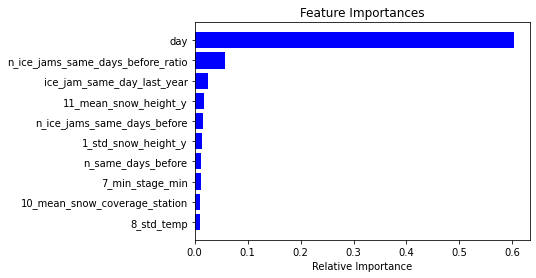

In [131]:
importances = gbm.feature_importances_
indices = np.argsort(importances)[-10:]

features = X_train_O.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [130]:
print(importances[indices[-3:]])

[0.02534798 0.05633574 0.60233238]


In [111]:
y_true = y_test_O
y_pred = gbm.predict(X_test_O)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.25      0.03      0.05        38

    accuracy                           0.99      3608
   macro avg       0.62      0.51      0.52      3608
weighted avg       0.98      0.99      0.98      3608



In [26]:
import shap
# gbm_shap_values = shap.KernelExplainer(gbm.predict,X_test_O)

Using 3608 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


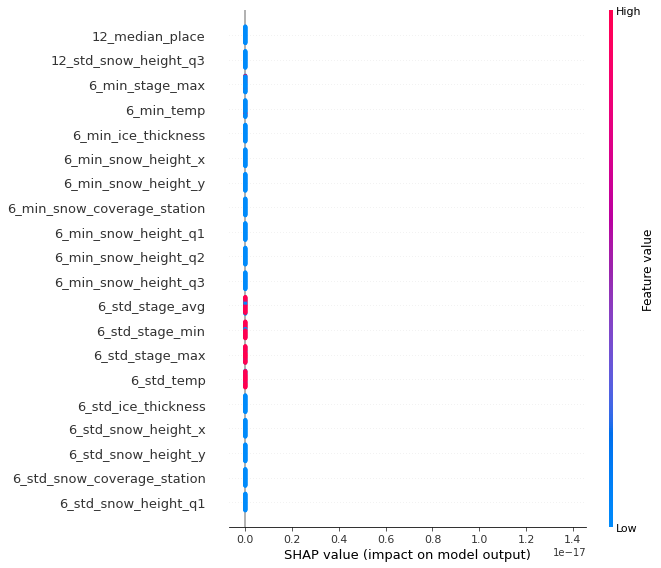

In [113]:
explainer2=shap.KernelExplainer(gbm.predict,X_train_O.iloc[:50,:])
shap_values2 = explainer2.shap_values(X_test_O.iloc[:50,:],nsamples=200)
shap.summary_plot(shap_values2, X_test_O.iloc[:50,:])

## SVM with Ola's data 2

In [48]:
X_train_O2 = pd.read_csv('ola_dataset2/X_train (1).csv')
y_train_O2 = pd.read_csv('ola_dataset2/y_train (1).csv')
X_test_O2 = pd.read_csv('ola_dataset2/X_test (1).csv')
y_test_O2 = pd.read_csv('ola_dataset2/y_test (1).csv')

Columns (44,62,114,132,184,394,552,604,622) have mixed types.Specify dtype option on import or set low_memory=False.
Columns (44,62,114,132,184,254,552,604,622) have mixed types.Specify dtype option on import or set low_memory=False.


In [69]:
X_train_O2.shape

(5642, 654)

In [90]:
for column_name in list(X_train_O2.columns):
#     print(column_name)
#     print(X_train_O2[column_name].dtypes.name)
    if X_train_O2[column_name].dtypes.name == 'bool':
        X_train_O2[column_name] = [1.0 if item == True else 0.0 for item in X_train_O2[column_name]]
    if X_train_O2[column_name].dtypes.name == 'int64':
        X_train_O2[column_name] = [np.float64(item) for item in X_train_O2[column_name]]
    if X_train_O2[column_name].dtypes.name != 'float64':
        print(column_name)
        del X_train_O2[column_name]

1_max_water_code
1_min_water_code
2_max_water_code
2_min_water_code
6_max_water_code
9_max_water_code
10_max_water_code
10_min_water_code
11_max_water_code
11_min_water_code
12_max_water_code
12_min_water_code


In [93]:
for column_name in list(X_test_O2.columns):
#     print(column_name)
#     print(X_train_O2[column_name].dtypes.name)
    if X_test_O2[column_name].dtypes.name == 'bool':
        X_test_O2[column_name] = [1.0 if item == True else 0.0 for item in X_test_O2[column_name]]
    if X_test_O2[column_name].dtypes.name == 'int64':
        X_test_O2[column_name] = [np.float64(item) for item in X_test_O2[column_name]]
    if X_test_O2[column_name].dtypes.name != 'float64':
        print(column_name)
        del X_test_O2[column_name]

1_max_water_code
1_min_water_code
2_max_water_code
2_min_water_code
6_max_water_code
7_max_water_code
10_max_water_code
10_min_water_code
11_max_water_code
11_min_water_code
12_max_water_code
12_min_water_code


In [57]:
replace_all_bool_and_int_to_float(X_train_O2)
replace_all_bool_and_int_to_float(X_test_O2)


In [116]:
from sklearn import ensemble
n_estimators = 900
# gbm = ensemble.GradientBoostingClassifier(
#             n_estimators=n_estimators,
#             validation_fraction=0.2,
#             n_iter_no_change=5, 
#             tol=0.01,
#             random_state=0,
#             verbose=10)
gbm2 = ensemble.GradientBoostingClassifier(
            n_estimators=n_estimators,
            random_state=0, verbose=10)
gbm2.fit(X_train_O2, y_train_O2)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


      Iter       Train Loss   Remaining Time 
         1           0.1335            2.31m
         2           0.1273            2.23m
         3           0.1223            2.24m
         4           0.1186            2.22m
         5           0.1156            2.21m
         6           0.1125            2.21m
         7           0.1086            2.23m
         8           0.1060            2.22m
         9           0.1036            2.22m
        10           0.1015            2.22m
        11           0.1002            2.22m
        12           0.0988            2.21m
        13           0.0974            2.22m
        14           0.0964            2.21m
        15           0.0948            2.21m
        16           0.0937            2.21m
        17           0.0929            2.21m
        18           0.0908            2.20m
        19           0.0897            2.20m
        20           0.0891            2.20m
        21           0.0878            2.19m
        2

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=900,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=10,
                           warm_start=False)

In [117]:
y_true = y_test_O2
y_pred = gbm2.predict(X_test_O2)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.10      0.03      0.04        38

    accuracy                           0.99      3608
   macro avg       0.54      0.51      0.52      3608
weighted avg       0.98      0.99      0.98      3608



## Try to train classifier on new preprocessed dataset

In [132]:
# import zipfile
# with zipfile.ZipFile('preprocessed.zip', 'r') as zip_ref:
#     zip_ref.extractall('preprocessed_dataset')

In [133]:
X_train_best = pd.read_csv('preprocessed_dataset/X_train.csv')
y_train_best = pd.read_csv('preprocessed_dataset/y_train.csv')
X_test_best = pd.read_csv('preprocessed_dataset/X_test.csv')
y_test_best = pd.read_csv('preprocessed_dataset/y_test.csv')

In [138]:
from sklearn import ensemble
n_estimators = 1000
gbm = ensemble.GradientBoostingClassifier(
            n_estimators=n_estimators,
            random_state=0, verbose=10)
gbm.fit(X_train_best, y_train_best)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


      Iter       Train Loss   Remaining Time 
         1           0.1337            3.52m
         2           0.1273            3.42m
         3           0.1219            3.45m
         4           0.1187            3.42m
         5           0.1148            3.41m
         6           0.1104            3.42m
         7           0.1084            3.41m
         8           0.1055            3.40m
         9           0.1037            3.39m
        10           0.1022            3.39m
        11           0.1003            3.39m
        12           0.0995            3.39m
        13           0.0981            3.40m
        14           0.0964            3.38m
        15           0.0947            3.38m
        16           0.0936            3.38m
        17           0.0920            3.37m
        18           0.0908            3.38m
        19           0.0900            3.38m
        20           0.0892            3.38m
        21           0.0887            3.38m
        2

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=1000,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=10,
                           warm_start=False)

In [136]:
y_true = y_test_best
y_pred = gbm.predict(X_test_best)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.08      0.03      0.04        38

    accuracy                           0.99      3608
   macro avg       0.54      0.51      0.52      3608
weighted avg       0.98      0.99      0.98      3608



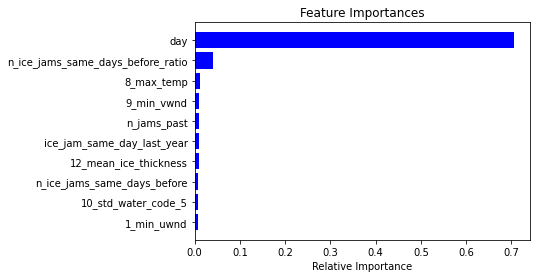

In [137]:
importances = gbm.feature_importances_
indices = np.argsort(importances)[-10:]

features = X_train_best.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Try to train multiple models

In [162]:
seed = 7
# prepare models
models = []
models.append(('SupportVectorClassifier', SVC()))
models.append(('StochasticGradientDecentC', SGDClassifier()))
models.append(('RandomForestClassifier', RandomForestClassifier()))
models.append(('DecisionTreeClassifier', DecisionTreeClassifier()))
models.append(('GaussianNB', GaussianNB()))
models.append(('KNeighborsClassifier', KNeighborsClassifier()))
models.append(('AdaBoostClassifier', AdaBoostClassifier()))
models.append(('LogisticRegression', LogisticRegression()))
# evaluate each model in turn
results = []
names = []
scoring = 'f1_macro'
for name, model in models:
    kfold = KFold(n_splits=3, random_state=seed)
    cv_results = cross_val_score(model, X_train_best, y_train_best, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
#     y_true = y_test_best
#     y_pred = model.predict(X_test_best)
#     f1 = f1_score(y_true, y_pred)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


SupportVectorClassifier: 0.496609 (0.000662)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


StochasticGradientDecentC: 0.496609 (0.000662)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestClassifier: 0.496609 (0.000662)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.


DecisionTreeClassifier: 0.504462 (0.010118)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


GaussianNB: 0.417111 (0.020680)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


KNeighborsClassifier: 0.495123 (0.000065)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


AdaBoostClassifier: 0.496609 (0.000662)


Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/st

LogisticRegression: 0.494603 (0.003398)


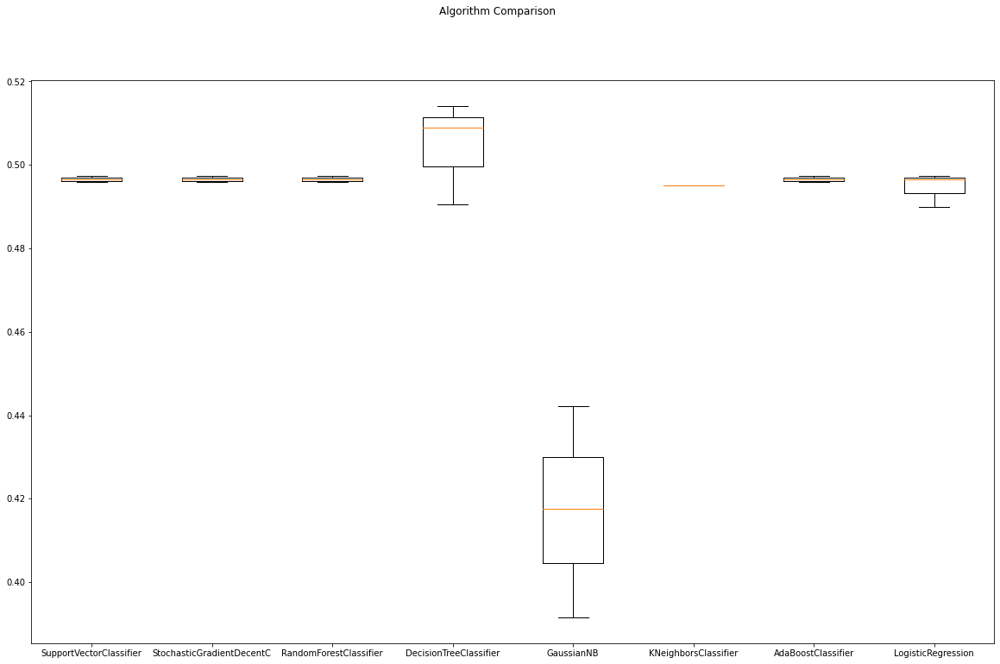

In [163]:
# boxplot algorithm comparison
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results, linewidth=2.5,width=0.5)
ax.set_xticklabels(names)
plt.show()

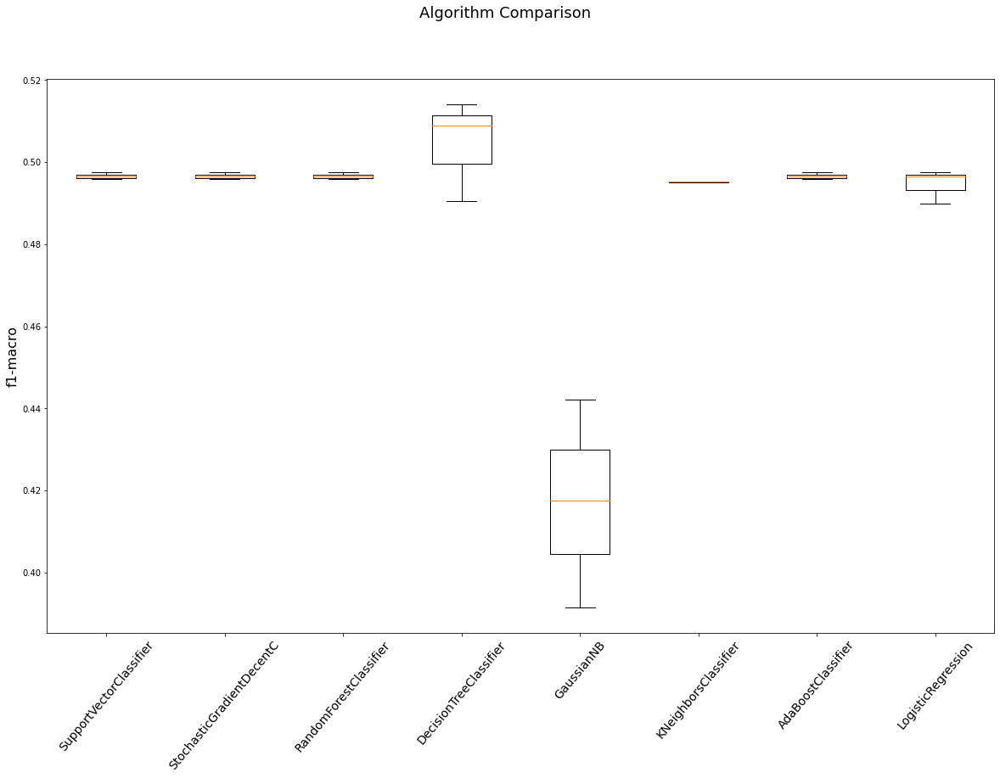

In [240]:
# boxplot algorithm comparison
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Algorithm Comparison', fontsize=18)
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_ylabel("f1-macro",fontsize=16)
# ax.set_yticklabels(fontsize=12, rotation=70)
ax.set_xticklabels(names, fontsize=14, rotation=50)
plt.show()

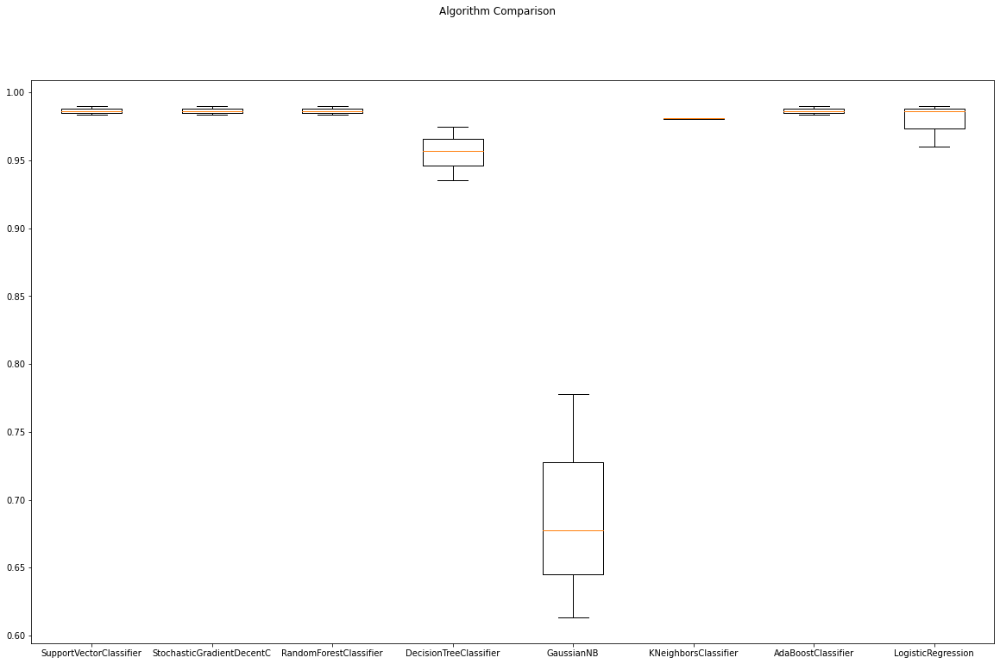

In [147]:
# boxplot algorithm comparison
fig = plt.figure(figsize=(20, 12))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

## Train GaussianNB

In [151]:

gnb = GaussianNB()
gnb.fit(X_train_best, y_train_best)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


GaussianNB(priors=None, var_smoothing=1e-09)

In [152]:
y_true = y_test_best
y_pred = gnb.predict(X_test_best)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.60      0.75      3570
     class 1       0.02      0.63      0.03        38

    accuracy                           0.60      3608
   macro avg       0.51      0.62      0.39      3608
weighted avg       0.98      0.60      0.74      3608



In [159]:
params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=GaussianNB(), 
                 param_grid=params_NB, 
                 cv=KFold(n_splits=3, random_state=seed),   # use any cross validation technique 
                 verbose=1, 
                 scoring='f1_macro') 
gs_NB.fit(X_train_best, y_train_best)

gs_NB.best_params_

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


Fitting 3 folds for each of 100 candidates, totalling 300 fits


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please cha

{'var_smoothing': 1.0}

In [161]:
y_true = y_test_best
y_pred = gs_NB.predict(X_test_best)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.00      0.00      0.00        38

    accuracy                           0.99      3608
   macro avg       0.49      0.50      0.50      3608
weighted avg       0.98      0.99      0.98      3608



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


## Train KNeighboursClassifier

In [155]:
knn = KNeighborsClassifier()
knn.fit(X_train_best, y_train_best)

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [156]:
y_true = y_test_best
y_pred = knn.predict(X_test_best)
# y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.99      0.99      3570
     class 1       0.04      0.03      0.03        38

    accuracy                           0.98      3608
   macro avg       0.51      0.51      0.51      3608
weighted avg       0.98      0.98      0.98      3608



### Попробуем обучить нейронную сеть и посмотрим какие резуотаты она дает

In [1]:
import tensorflow as tf

from tensorflow.compat.v1.keras.layers import *
from tensorflow.compat.v1.keras import *
from tensorflow.compat.v1.keras.models import *
from tensorflow.compat.v1.keras.optimizers import *
from tensorflow.compat.v1.keras.callbacks import *
import tensorflow.compat.v1.keras.backend as K

from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

from collections import Counter

physical_devices = tf.config.experimental.list_physical_devices('GPU')
assert len(physical_devices) > 0, "Not enough GPU hardware devices available"
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [136]:
# def recall_m(y_true, y_pred):
#     true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
#     possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
#     recall = true_positives / (possible_positives + K.epsilon())
#     return recall

# def precision_m(y_true, y_pred):
#     true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
#     predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
#     precision = true_positives / (predicted_positives + K.epsilon())
#     return precision

# def f1_m(y_true, y_pred):
#     precision = precision_m(y_true, y_pred)
#     recall = recall_m(y_true, y_pred)
#     return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [2]:
X_train.shape
X_test.shape
y_train.shape

NameError: name 'X_train' is not defined

In [166]:
y_classes_nums = Counter(y_train_best['ice_jam'])
print(y_classes_nums)
weight_for_0 = 1.0 / y_classes_nums[0]
weight_for_1 = 1.0 / y_classes_nums[1]
class_weight = {0: weight_for_0, 1: weight_for_1}
print(class_weight)

Counter({0.0: 5566, 1.0: 76})
{0: 0.00017966223499820338, 1: 0.013157894736842105}


In [242]:
# y_classes_nums = Counter(y_train_O['ice_jam'])
# print(y_classes_nums)
# weight_for_0 = 1.0 / y_classes_nums[0]
# weight_for_1 = 1.0 / y_classes_nums[1]
# class_weight_O = {0: weight_for_0, 1: weight_for_1}
# print(class_weight_O)

Counter({0.0: 6399, 1.0: 79})
{0: 0.0001562744178777934, 1: 0.012658227848101266}


In [144]:
def createModel(learning_rate):

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(1796, ), dtype='int32'),
        tf.keras.layers.Dense(32, activation=tf.nn.relu),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(32, activation=tf.nn.relu),
        tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(2, activation=tf.nn.softmax)
    ])

    model.build(input_shape=(None, 1796))

    model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

    print(model.summary())
    return model

In [145]:
model = createModel(0.001)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 32)                57504     
_________________________________________________________________
dropout_2 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 32)                1056      
_________________________________________________________________
dropout_3 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 2)                 66        
Total params: 58,626
Trainable params: 58,626
Non-trainable params: 0
_________________________________________________________________
None


In [169]:
def fit_model(model, epochs, batch_size, class_weight, X_train, y_train):
    early_stop = EarlyStopping(monitor='val_loss', patience=4)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1)

    history = model.fit(
        X_train,
        y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_split = 0.2,
    #     validation_data=(X_test, y_test),
        verbose=1,
#         callbacks=[early_stop, reduce_lr],
        class_weight = class_weight,
    )
    
    print('Printing the plot...')
    
    plt.plot(history.history['binary_crossentropy'])
    plt.plot(history.history['val_binary_crossentropy'])
    plt.title('model binary_crossentropy')
    plt.ylabel('binary_crossentropy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    #sumatize history for acc
    plt.plot(history.history['acc'])
    plt.plot(history.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    
    return model

In [170]:
def clear_all():
    tf.keras.backend.clear_session()
    np.random.seed(1)
    tf.random.set_seed(1)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                57504     
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                1056      
_________________________________________________________________
dropout_1 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 66        
Total params: 58,626
Trainable params: 58,626
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/25
76/76 [==============================] - 1s 9ms/step - loss: 6.9941 - binary_crossentropy: 6.9899 - ac

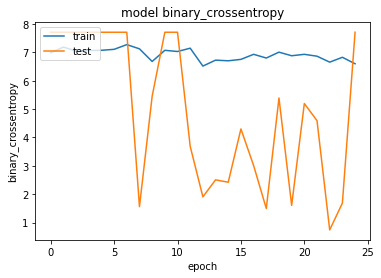

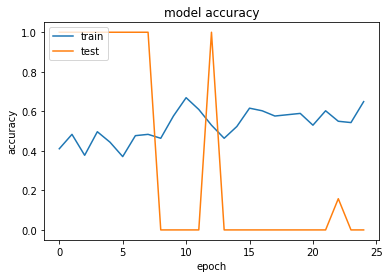

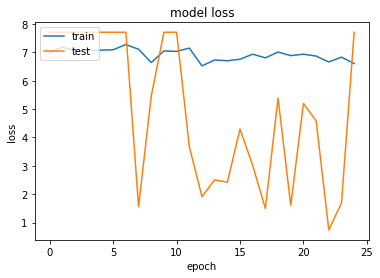

In [168]:
clear_all()
model = createModel(learning_rate=0.0001)


model = fit_model(model, 25, 2, class_weight, X, y)

In [75]:
# model.evaluate(X_test, y_test)

83/83 [==============================] - 0s 3ms/step - loss: 0.9903 - binary_crossentropy: 0.9859 - acc: 0.6426


[0.9902969598770142, 0.9859476089477539, 0.6426414847373962]

In [169]:
y_true = y_test
preds = model.predict(X_test)
y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [161]:
f1_score(y_true, y_pred)

0.0

In [128]:
# import shap

# # load your data here, e.g. X and y
# # create and fit your model here

# # load JS visualization code to notebook
# shap.initjs()

# # explain the model's predictions using SHAP
# # (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
# explainer = shap.TreeExplainer(model)
# shap_values = explainer.shap_values(X)

# # visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
# shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

# shap.summary_plot(shap_values, X, plot_type="bar")

Exception: Model type not yet supported by TreeExplainer: <class 'tensorflow.python.keras.engine.sequential.Sequential'>

In [132]:
# from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
# import eli5
# from eli5.sklearn import PermutationImportance

# # def base_model():
# #     model = Sequential()        
# #     ...
# #     return model

# # X = ...
# # y = ...

# my_model = KerasClassifier(model)    
# my_model.fit(X_train,y_train)

# perm = PermutationImportance(my_model, random_state=1).fit(X_train,y_train)
# eli5.show_weights(perm, feature_names = X_train.columns.tolist())

AttributeError: 'KerasClassifier' object has no attribute 'classes_'

In [130]:
!pip install eli5

     |████████████████████████████████| 106 kB 883 kB/s eta 0:00:01
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


## Try to use SMOTE to reduce imbalance

In [164]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# over = SMOTE(sampling_strategy=0.1)
# X, y = over.fit_resample(X_train, y_train)

under = RandomUnderSampler(sampling_strategy=0.5)
X, y = under.fit_resample(X_train, y_train)

## Find dependensies between the data

In [181]:
X_train.iloc[:, 10:20]

,1_mean_place,1_mean_discharge,1_mean_route_type,1_mean_snow_coverage_near_station,1_mean_snow_coverage_route,1_mean_ice_crust_route,1_mean_snow_height_aver,1_mean_snow_height_max,1_mean_snow_height_min,1_mean_snow_density_aver
0,-0.296448,-0.337384,-1.252140,-0.33743,-1.231207,0.0,-1.035231,-1.042948,-1.011871,-1.174037
1,-0.296448,-0.337384,-1.252140,-0.33743,-1.231207,0.0,-1.035231,-1.042948,-1.011871,-1.174037
2,-0.296448,-0.337384,-1.252140,-0.33743,-1.231207,0.0,-1.035231,-1.042948,-1.011871,-1.174037
3,-0.296448,-0.337384,-1.252140,-0.33743,-1.231207,0.0,-1.035231,-1.042948,-1.011871,-1.174037
4,-0.296448,-0.337384,-1.252140,-0.33743,-1.231207,0.0,-1.035231,-1.042948,-1.011871,-1.174037
...,...,...,...,...,...,...,...,...,...,...
6111,-0.296448,-0.337384,1.068065,-0.33743,0.605226,0.0,0.733712,0.823259,0.211863,0.655113
6112,-0.296448,-0.337384,1.068065,-0.33743,0.605226,0.0,0.733712,0.823259,0.211863,0.655113
6113,-0.296448,-0.337384,1.068065,-0.33743,0.605226,0.0,0.733712,0.823259,0.211863,0.655113
6114,-0.296448,-0.337384,1.068065,-0.33743,0.605226,0.0,0.733712,0.823259,0.211863,0.655113


Text(0.5, 1.05, 'Pearson correlation of the features')

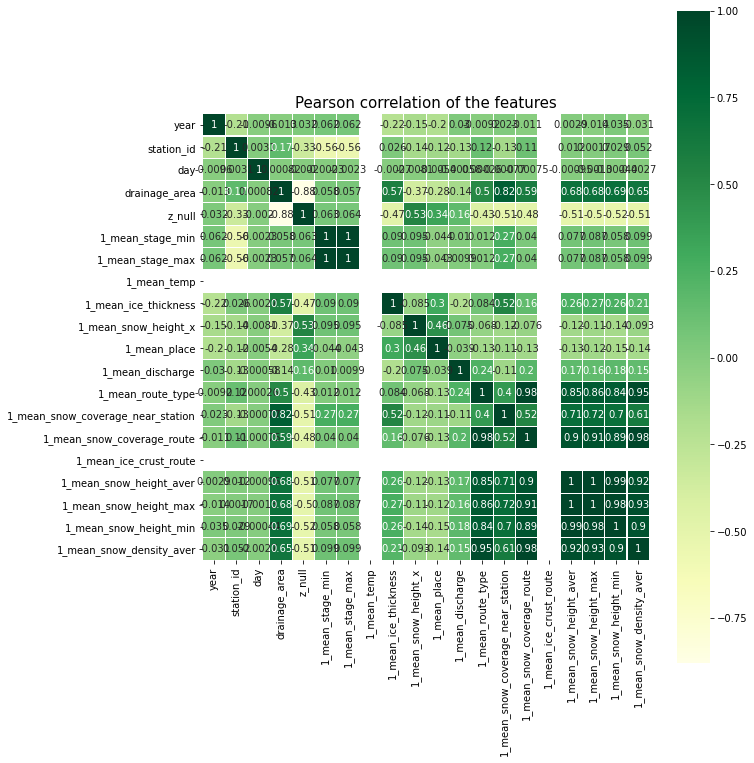

In [184]:
corr = X_train.iloc[:,:20].corr()

f, ax = plt.subplots(figsize=(10, 12))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
_ = sns.heatmap(corr, cmap="YlGn", square=True, ax=ax, annot=True, linewidth=0.1)
plt.title('Pearson correlation of the features', y=1.05, size=15)

## Select features

In [185]:
X_train_2 = X_train[X_train.columns.drop(list(X_train.filter(regex='qual')))]

In [186]:
X_test_2 = X_test[X_test.columns.drop(list(X_test.filter(regex='qual')))]

In [188]:
X_train_2.shape, y_train.shape

((6116, 1400), (6116,))

## My own grid search 

In [167]:
# currently the best model
# def createModel2(learning_rate, dense_cells_1, dense_cells_2, dropout):

#     model = tf.keras.Sequential([
#         tf.keras.layers.Input(shape=(1400, ), dtype='int32'),
#         tf.keras.layers.Dense(32, activation=tf.nn.relu),
#         tf.keras.layers.Dropout(0.15),
#         tf.keras.layers.Dense(16, activation=tf.nn.relu),
#         tf.keras.layers.Dropout(0.15),
#         tf.keras.layers.Dense(2, activation=tf.nn.softmax)
#     ])

#     model.build(input_shape=(None, 1400))

#     model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

#     print(model.summary())
#     return model



def createModel2(learning_rate, dense_cells_1, dense_cells_2, dropout):

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(1400, ), dtype='int32'),
        tf.keras.layers.Dense(dense_cells_1, activation=tf.nn.relu),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(dense_cells_2, activation=tf.nn.relu),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(2, activation=tf.nn.softmax)
    ])

    model.build(input_shape=(None, 1400))

    model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

#     print(model.summary())
    return model

Printing the plot...


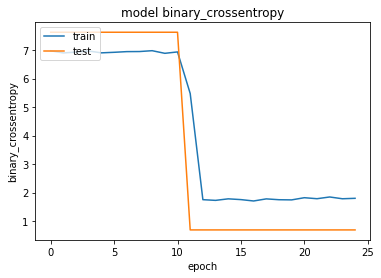

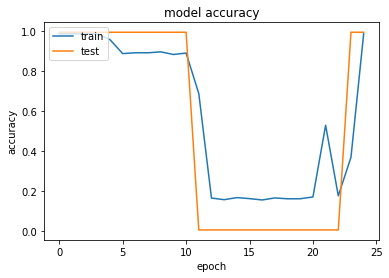

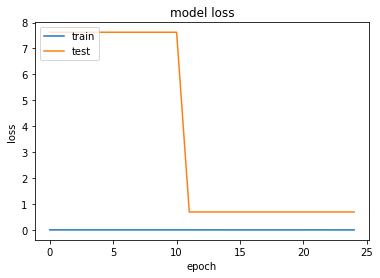

Model trained with dense_1 = 8, dense_2 = 2, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


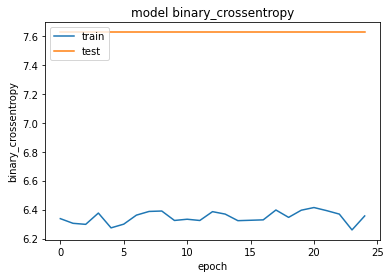

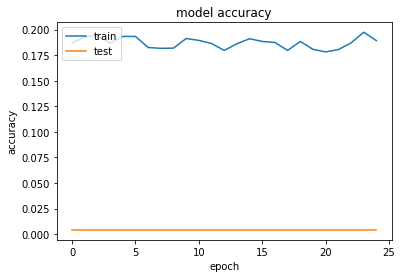

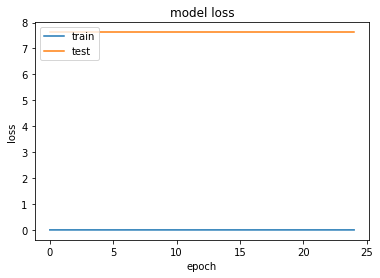

Model trained with dense_1 = 8, dense_2 = 2, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


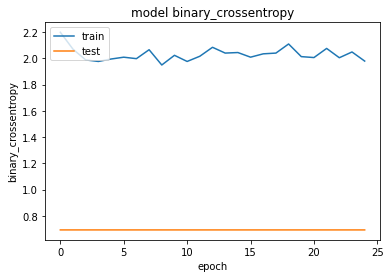

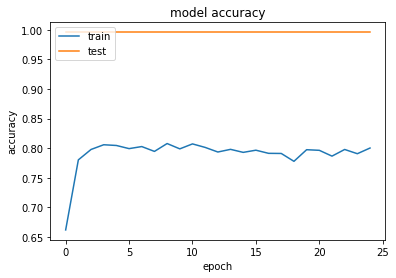

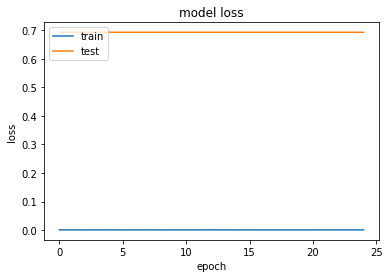

Model trained with dense_1 = 8, dense_2 = 2, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


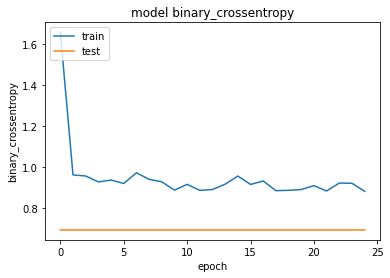

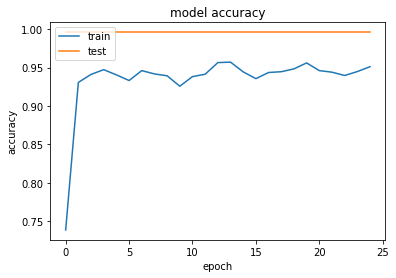

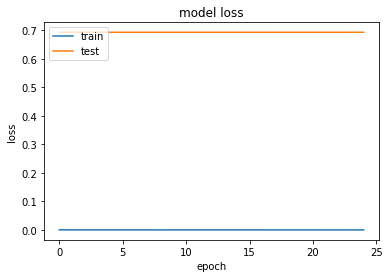

Model trained with dense_1 = 8, dense_2 = 4, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


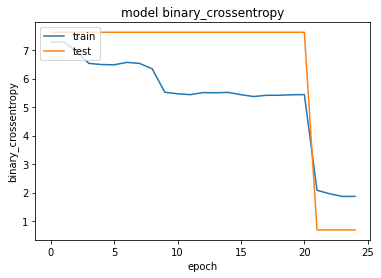

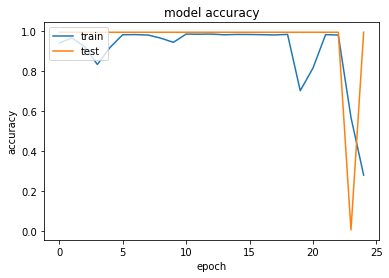

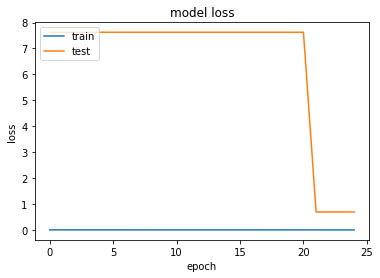

Model trained with dense_1 = 8, dense_2 = 4, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


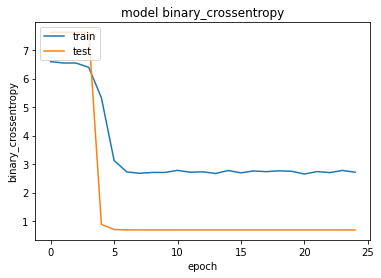

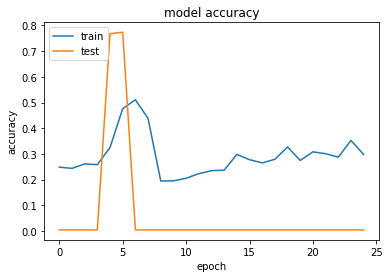

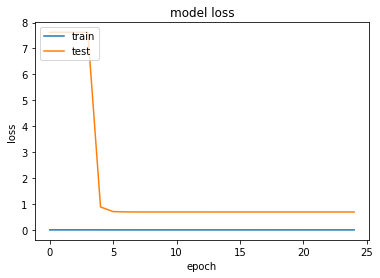

Model trained with dense_1 = 8, dense_2 = 4, dropout=0.3
              precision    recall  f1-score   support

     class 0       0.78      0.00      0.01      2608
     class 1       0.02      0.95      0.03        42

    accuracy                           0.02      2650
   macro avg       0.40      0.48      0.02      2650
weighted avg       0.77      0.02      0.01      2650

Printing the plot...


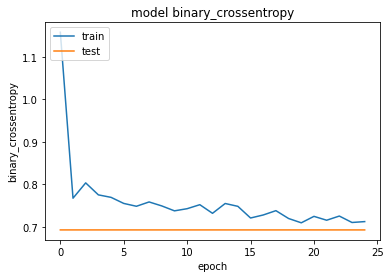

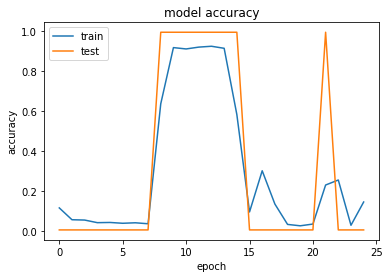

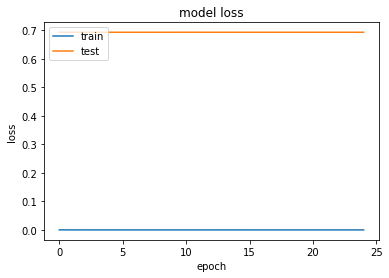

Model trained with dense_1 = 8, dense_2 = 8, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


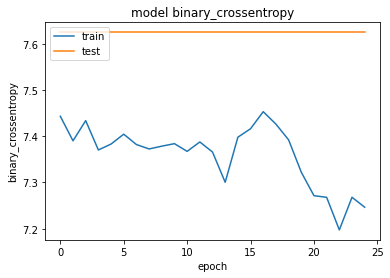

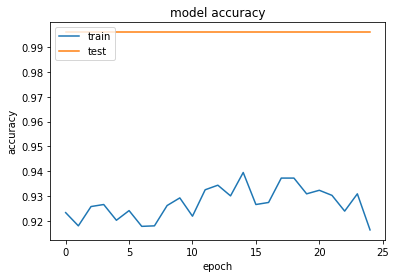

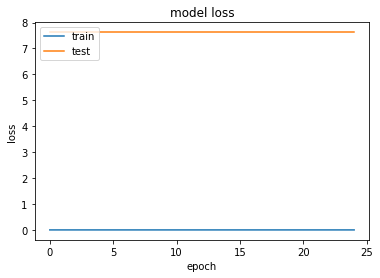

Model trained with dense_1 = 8, dense_2 = 8, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


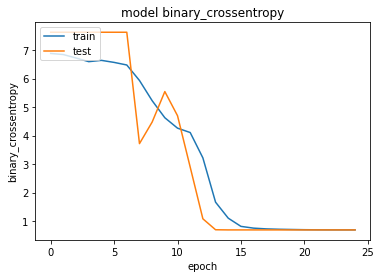

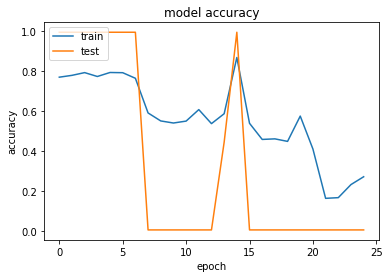

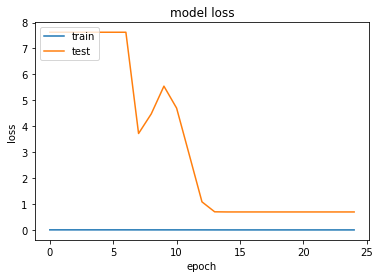

Model trained with dense_1 = 8, dense_2 = 8, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


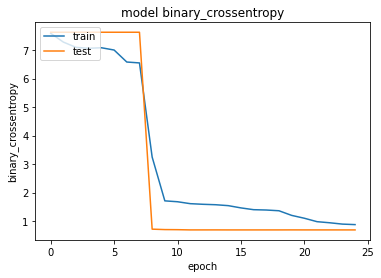

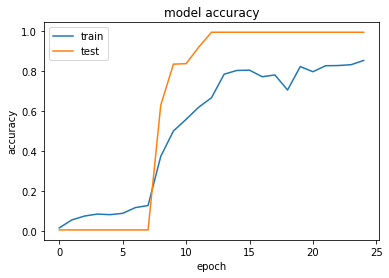

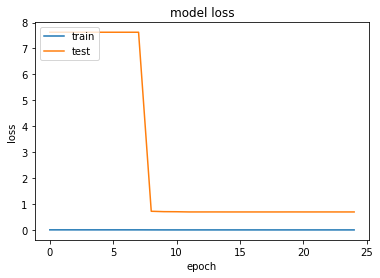

Model trained with dense_1 = 8, dense_2 = 16, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


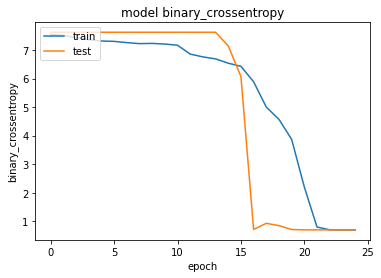

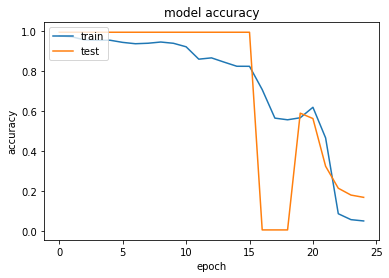

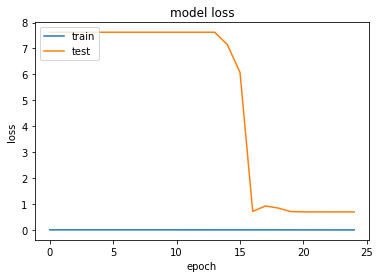

Model trained with dense_1 = 8, dense_2 = 16, dropout=0.2
              precision    recall  f1-score   support

     class 0       1.00      0.08      0.15      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.10      2650
   macro avg       0.51      0.54      0.09      2650
weighted avg       0.98      0.10      0.15      2650

Printing the plot...


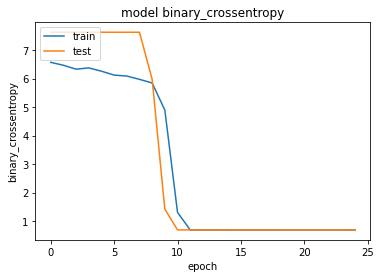

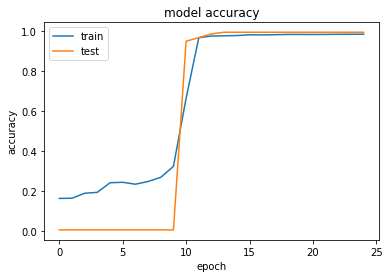

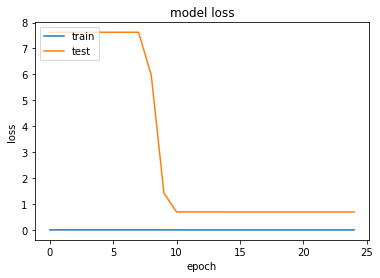

Model trained with dense_1 = 8, dense_2 = 16, dropout=0.3
              precision    recall  f1-score   support

     class 0       0.98      0.98      0.98      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.97      2650
   macro avg       0.49      0.49      0.49      2650
weighted avg       0.97      0.97      0.97      2650

Printing the plot...


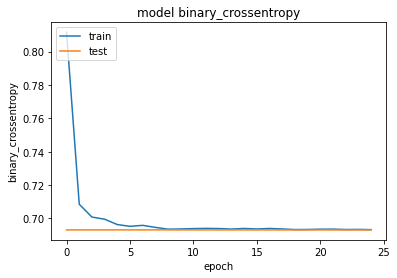

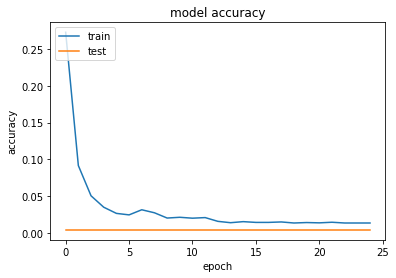

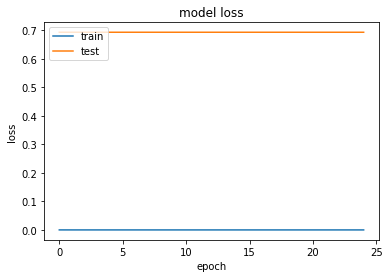

Model trained with dense_1 = 16, dense_2 = 2, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


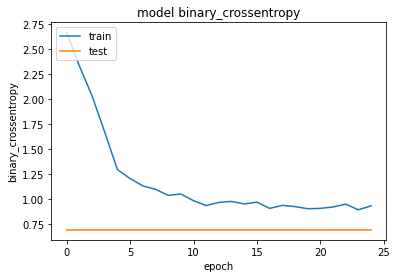

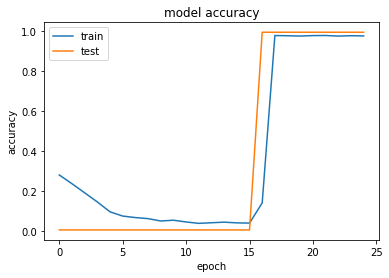

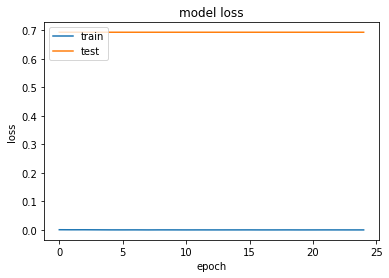

Model trained with dense_1 = 16, dense_2 = 2, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


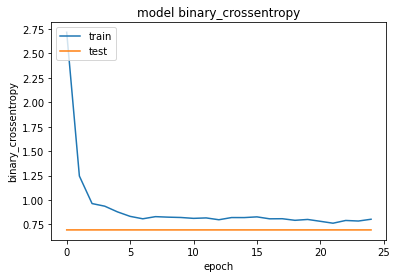

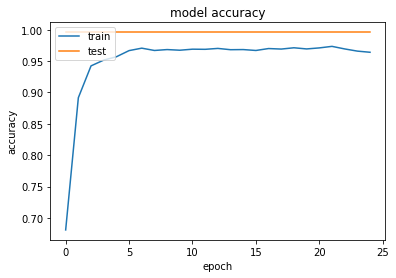

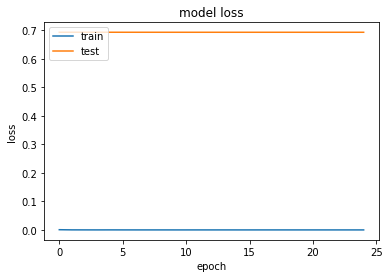

Model trained with dense_1 = 16, dense_2 = 2, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


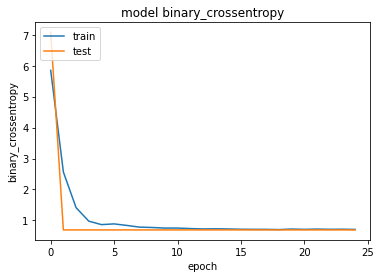

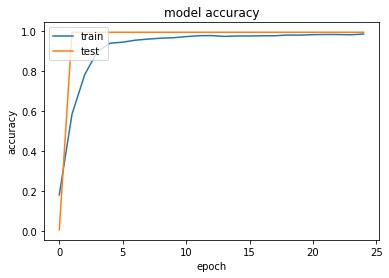

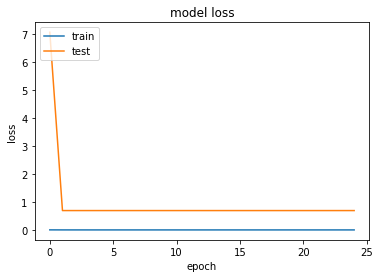

Model trained with dense_1 = 16, dense_2 = 4, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


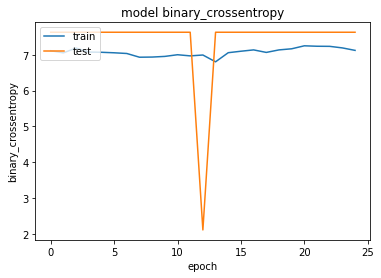

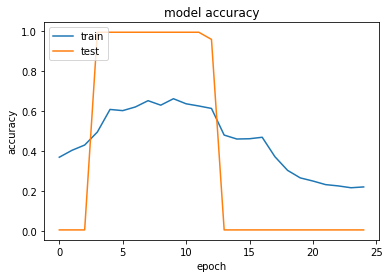

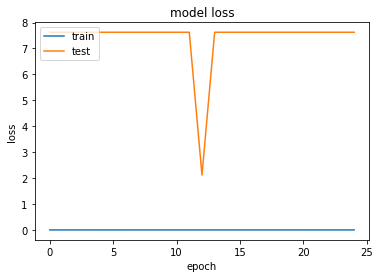

Model trained with dense_1 = 16, dense_2 = 4, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


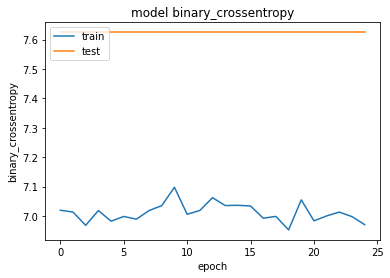

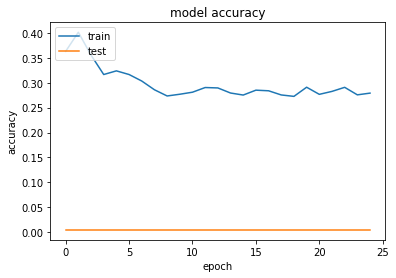

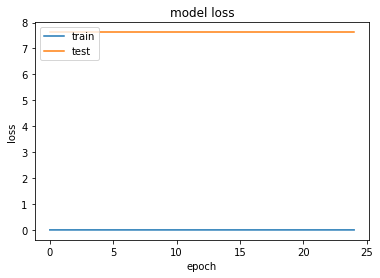

Model trained with dense_1 = 16, dense_2 = 4, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


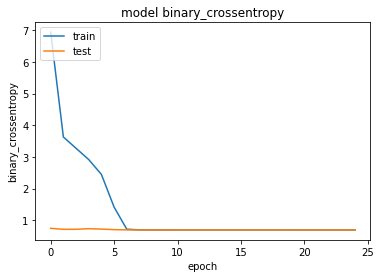

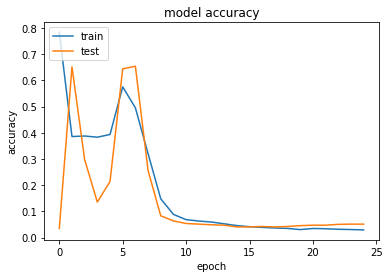

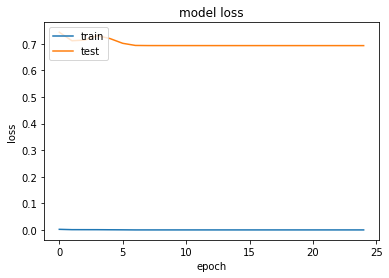

Model trained with dense_1 = 16, dense_2 = 8, dropout=0.1
              precision    recall  f1-score   support

     class 0       1.00      0.04      0.08      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.06      2650
   macro avg       0.51      0.52      0.06      2650
weighted avg       0.98      0.06      0.08      2650

Printing the plot...


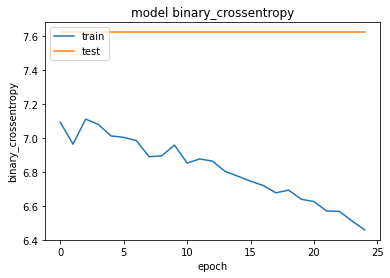

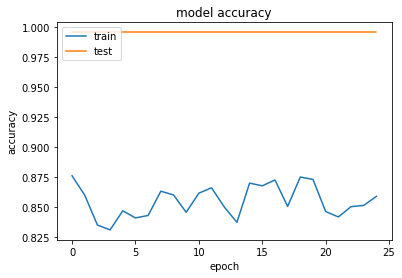

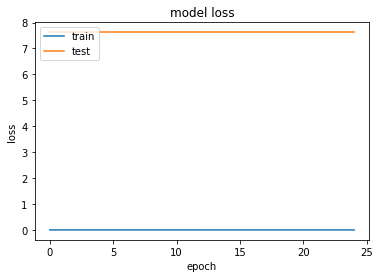

Model trained with dense_1 = 16, dense_2 = 8, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


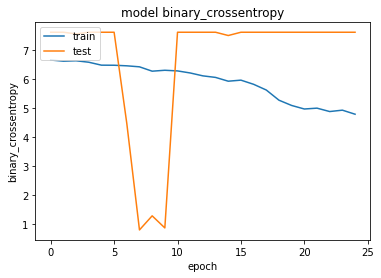

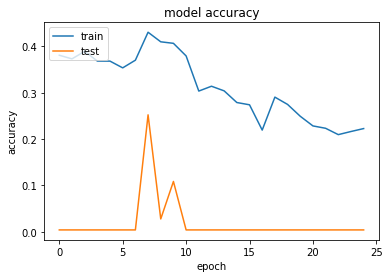

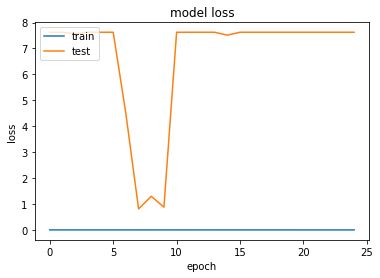

Model trained with dense_1 = 16, dense_2 = 8, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


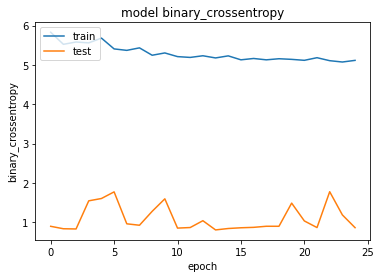

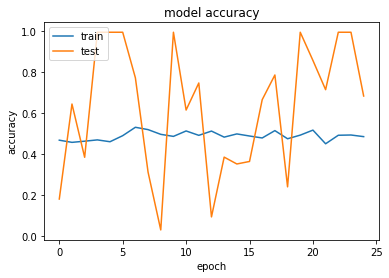

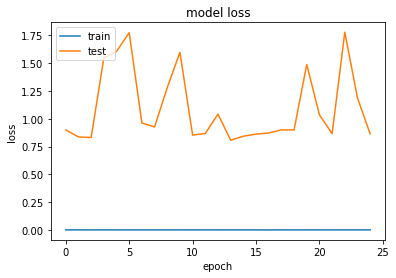

Model trained with dense_1 = 16, dense_2 = 16, dropout=0.1
              precision    recall  f1-score   support

     class 0       0.98      0.56      0.72      2608
     class 1       0.01      0.31      0.02        42

    accuracy                           0.56      2650
   macro avg       0.50      0.44      0.37      2650
weighted avg       0.97      0.56      0.70      2650

Printing the plot...


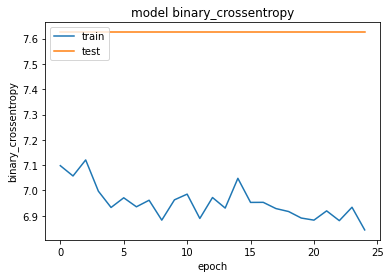

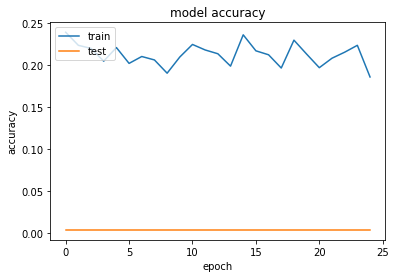

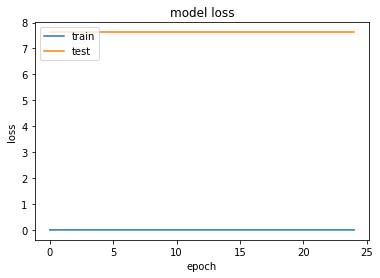

Model trained with dense_1 = 16, dense_2 = 16, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


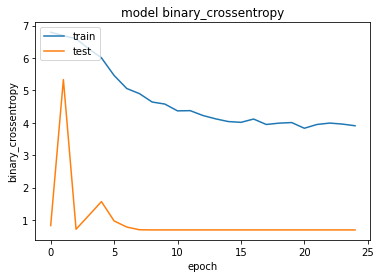

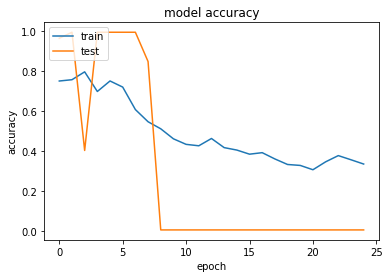

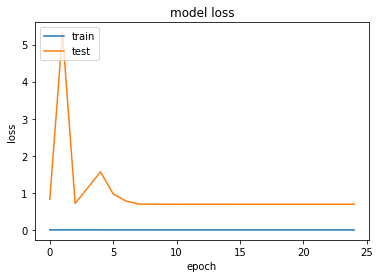

Model trained with dense_1 = 16, dense_2 = 16, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


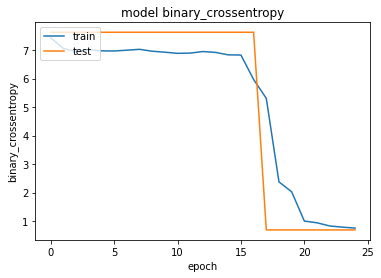

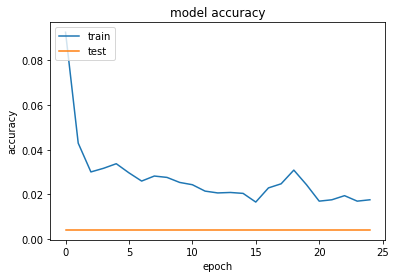

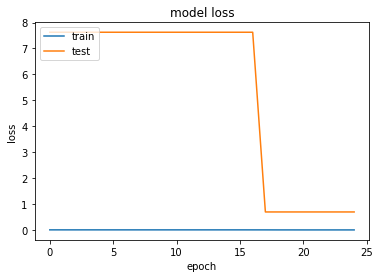

Model trained with dense_1 = 32, dense_2 = 2, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


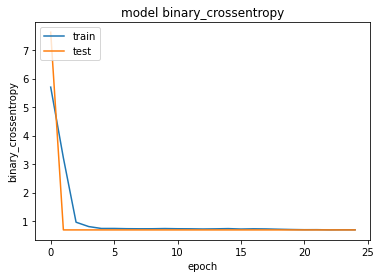

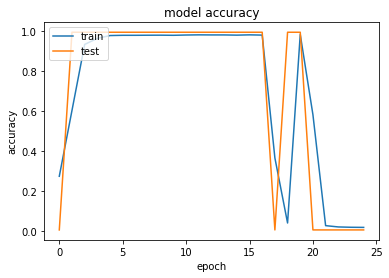

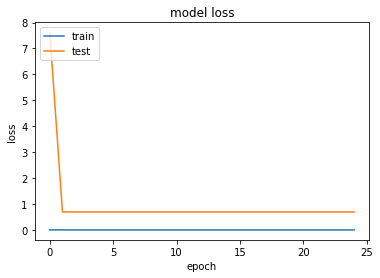

Model trained with dense_1 = 32, dense_2 = 2, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


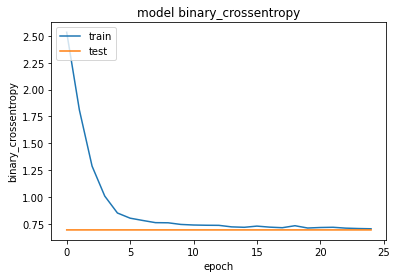

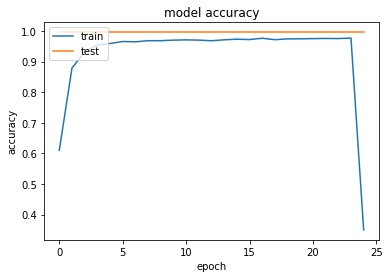

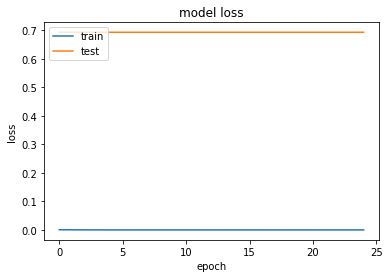

Model trained with dense_1 = 32, dense_2 = 2, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


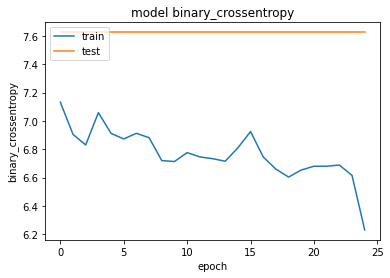

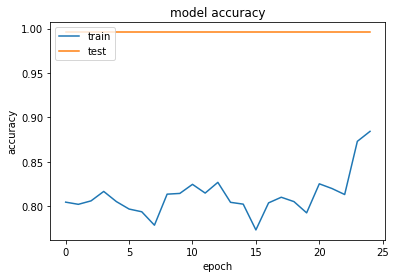

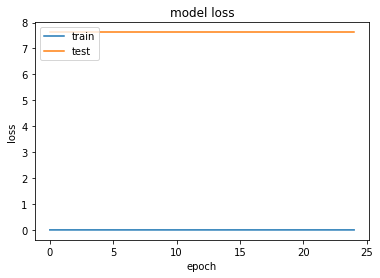

Model trained with dense_1 = 32, dense_2 = 4, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


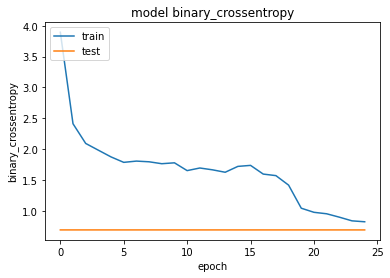

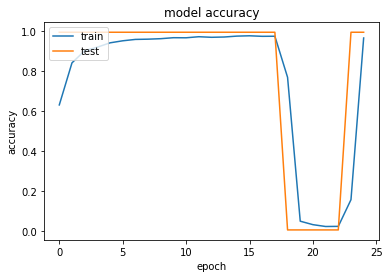

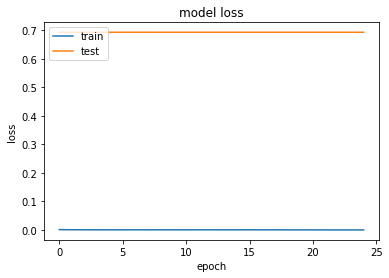

Model trained with dense_1 = 32, dense_2 = 4, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


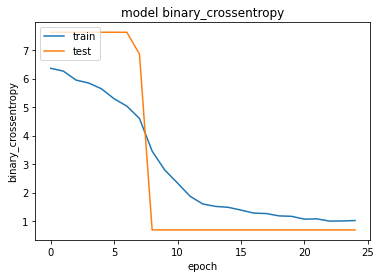

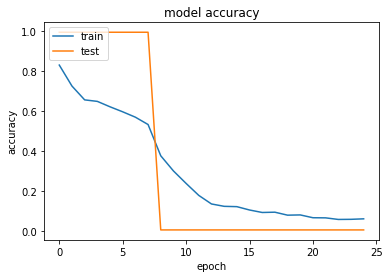

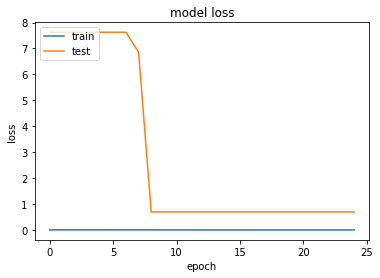

Model trained with dense_1 = 32, dense_2 = 4, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


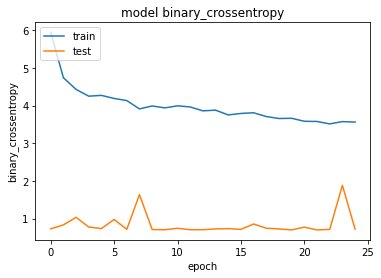

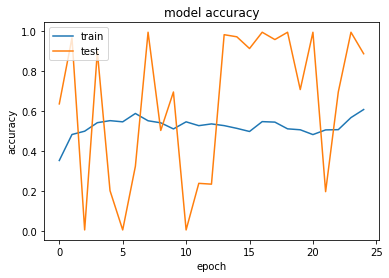

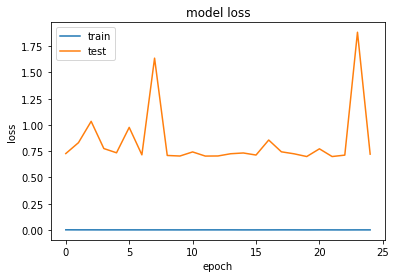

Model trained with dense_1 = 32, dense_2 = 8, dropout=0.1
              precision    recall  f1-score   support

     class 0       0.98      0.86      0.92      2608
     class 1       0.01      0.07      0.01        42

    accuracy                           0.84      2650
   macro avg       0.50      0.46      0.46      2650
weighted avg       0.97      0.84      0.90      2650

Printing the plot...


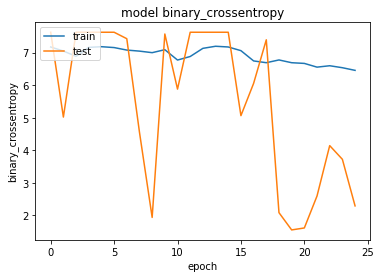

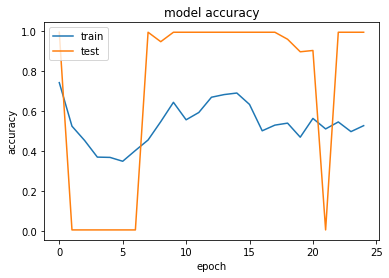

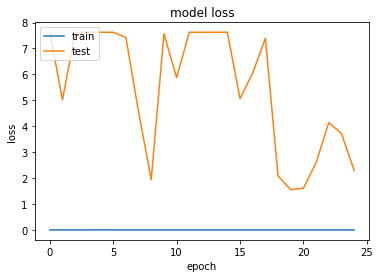

Model trained with dense_1 = 32, dense_2 = 8, dropout=0.2
              precision    recall  f1-score   support

     class 0       0.98      0.99      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.49      2650
weighted avg       0.97      0.98      0.97      2650

Printing the plot...


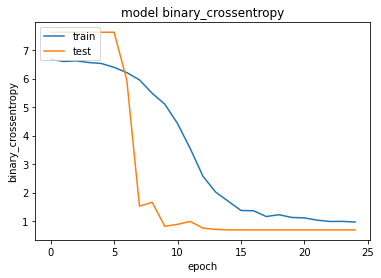

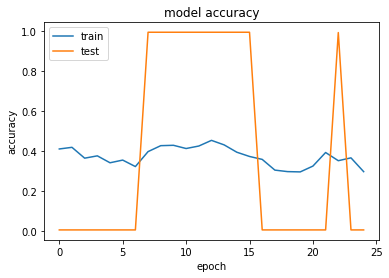

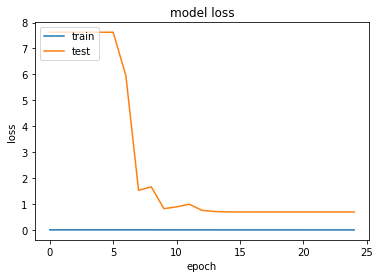

Model trained with dense_1 = 32, dense_2 = 8, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


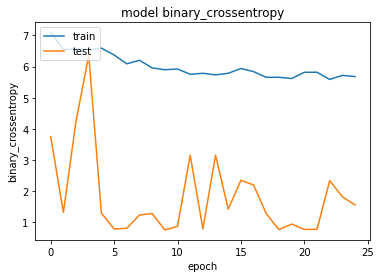

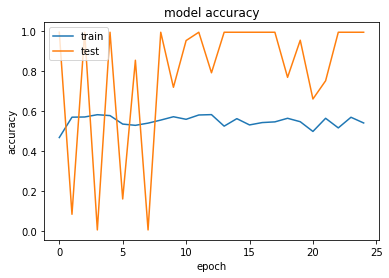

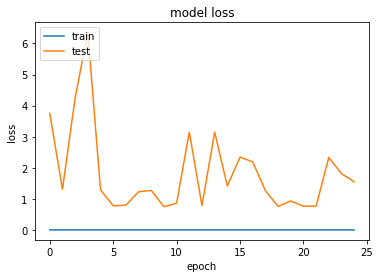

Model trained with dense_1 = 32, dense_2 = 16, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


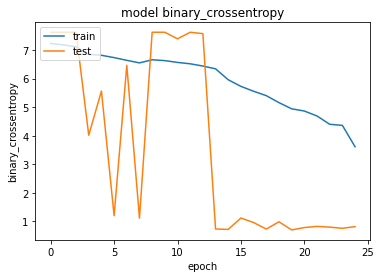

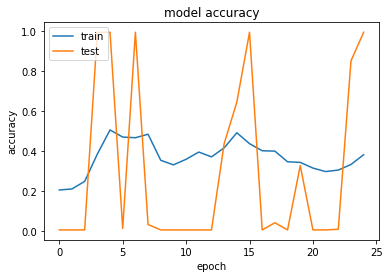

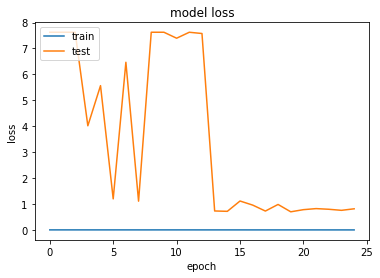

Model trained with dense_1 = 32, dense_2 = 16, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


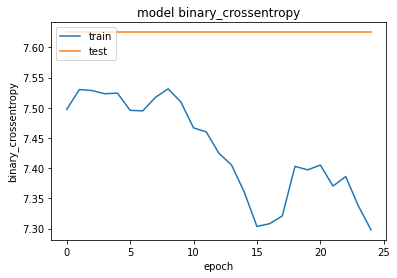

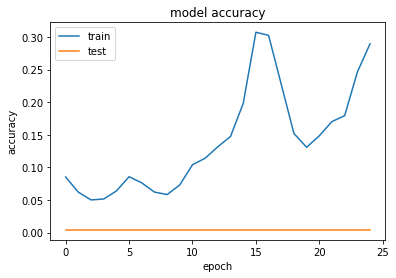

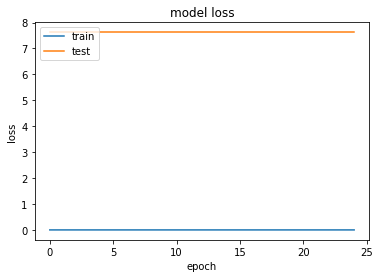

Model trained with dense_1 = 32, dense_2 = 16, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


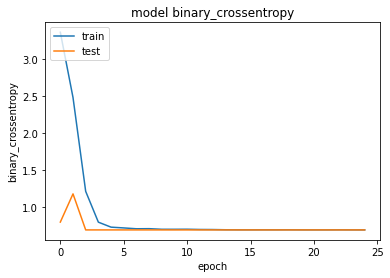

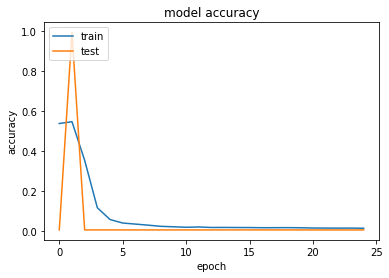

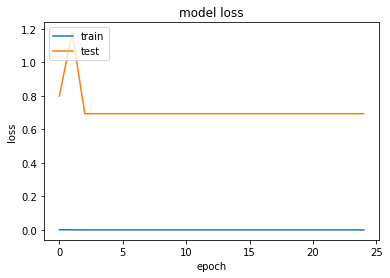

Model trained with dense_1 = 64, dense_2 = 2, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


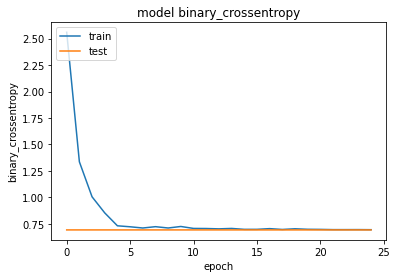

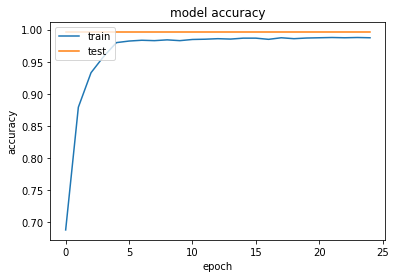

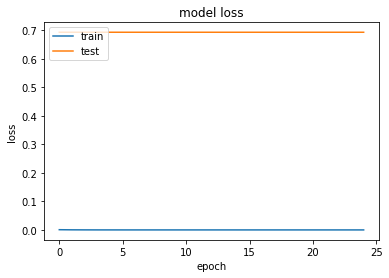

Model trained with dense_1 = 64, dense_2 = 2, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


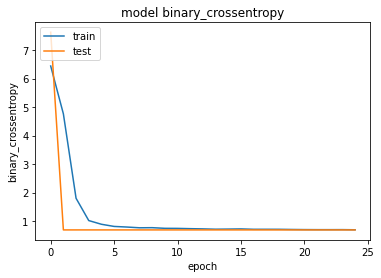

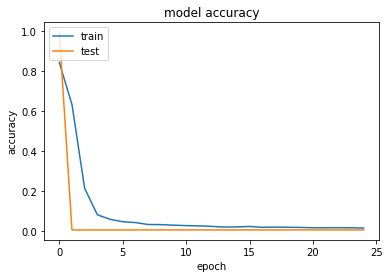

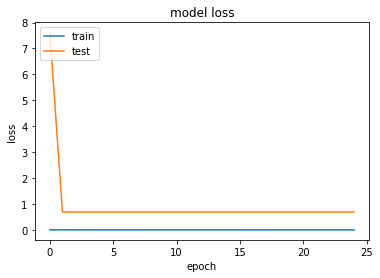

Model trained with dense_1 = 64, dense_2 = 2, dropout=0.3


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650

Printing the plot...


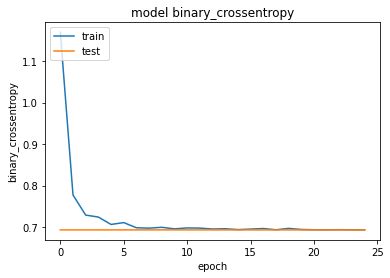

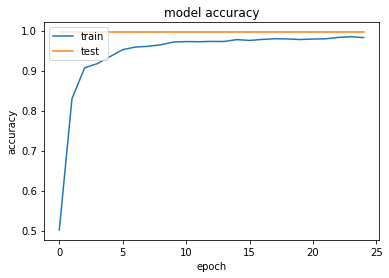

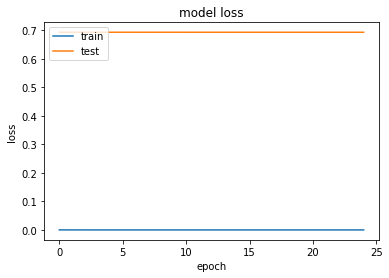

Model trained with dense_1 = 64, dense_2 = 4, dropout=0.1


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.98      1.00      0.99      2608
     class 1       0.00      0.00      0.00        42

    accuracy                           0.98      2650
   macro avg       0.49      0.50      0.50      2650
weighted avg       0.97      0.98      0.98      2650

Printing the plot...


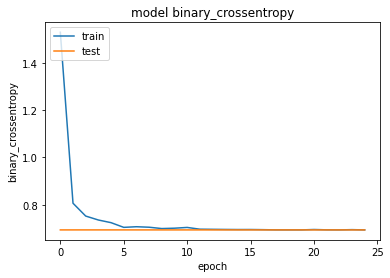

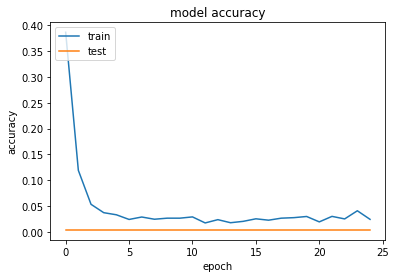

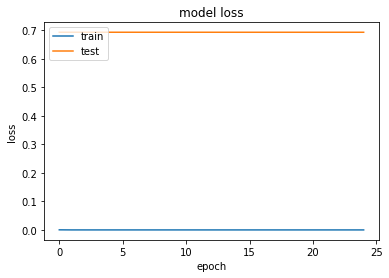

Model trained with dense_1 = 64, dense_2 = 4, dropout=0.2


Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      2608
     class 1       0.02      1.00      0.03        42

    accuracy                           0.02      2650
   macro avg       0.01      0.50      0.02      2650
weighted avg       0.00      0.02      0.00      2650



ResourceExhaustedError: OOM when allocating tensor with shape[1224,1400] and type double on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:GatherV2]

In [353]:
best_model = None
best_f1_score = 0
# model = createModel2(learning_rate=0.0001)
for dense_1 in [8, 16, 32, 64]:
    for dense_2 in [2, 4, 8, 16]:
        for dropout in [0.1, 0.2, 0.3]:
#             clear_all()
            model = createModel2(0.0001, dense_1, dense_2, dropout)
            model = fit_model(model, 25, 25, class_weight, X_train_2, y_train)
            print(f"Model trained with dense_1 = {dense_1}, dense_2 = {dense_2}, dropout={dropout}")
            y_true = y_test
            preds = model.predict(X_test_2)
            y_pred = np.argmax(preds, axis=1)
            target_names = ['class 0', 'class 1']
            print(classification_report(y_true, y_pred, target_names=target_names))
            f1_model_score = f1_score(y_true, y_pred)
            if f1_model_score > best_f1_score:
                best_f1_score = f1_model_score
                best_model = model

In [334]:
y_true = y_test
preds = model.predict(X_test_2)
y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      0.35      0.52      2608
     class 1       0.02      0.76      0.04        42

    accuracy                           0.36      2650
   macro avg       0.50      0.56      0.28      2650
weighted avg       0.97      0.36      0.51      2650



### Ola's data

In [5]:
X_train_O = pd.read_csv('ola_dataset/X_train.csv')
y_train_O = pd.read_csv('ola_dataset/y_train.csv')
X_test_O = pd.read_csv('ola_dataset/X_test.csv')
y_test_O = pd.read_csv('ola_dataset/y_test.csv')

In [250]:
# Convert all boolean values in DS to float


# for column_name in list(X_train_O.columns):
#     print(column_name)
#     print(X_train_O[column_name].dtypes.name)
#     if X_train_O[column_name].dtypes.name == 'bool':
#         X_train_O[column_name] = [1.0 if item == True else 0.0 for item in X_train_O[column_name]]

# for column_name in list(X_test_O.columns):
#     print(column_name)
#     print(X_test_O[column_name].dtypes.name)
#     if X_test_O[column_name].dtypes.name == 'bool':
#         X_test_O[column_name] = [1.0 if item == True else 0.0 for item in X_test_O[column_name]]

year
int64
station_id
int64
day
int64
is_test
bool
station_rank_x
int64
ice_jam_same_day_last_year
float64
station_rank_y
float64
ice_jam_same_day_prelast_year
float64
station_rank
float64
is_last_year_missing
bool
is_prelast_year_missing
bool
n_jams_last_year
float64
n_jams_prelast_year
float64
n_jams_past
float64
n_same_days_before
int64
n_ice_jams_same_days_before
float64
n_ice_jams_same_days_before_ratio
float64
distance_from_source
float64
drainage_area
int64
z_null
float64
1_mean_stage_min
float64
1_mean_stage_max
float64
1_mean_temp
float64
1_mean_ice_thickness
float64
1_mean_snow_height_x
float64
1_mean_snow_height_y
float64
1_mean_snow_coverage_station
float64
1_mean_snow_height_q1
float64
1_mean_snow_height_q2
float64
1_mean_snow_height_q3
float64
1_max_stage_avg
float64
1_max_stage_min
float64
1_max_stage_max
float64
1_max_temp
float64
1_max_ice_thickness
float64
1_max_snow_height_x
float64
1_max_snow_height_y
float64
1_max_snow_coverage_station
float64
1_max_snow_height_q1


In [234]:
# Check if everything converted OK

for column_name in list(X_train_O.columns):
    print(X_train_O[column_name].dtypes.name)
#     if X_train_O[column_name].dtypes.name == 'bool':
#         X_train_O[column_name] = [1.0 if item == True else 0.0 for item in X_train_O[column_name]]

int64
int64
int64
float64
int64
float64
float64
float64
float64
float64
float64
float64
float64
float64
int64
float64
float64
float64
int64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
floa

In [145]:
def createModel(num_of_features, learning_rate):

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(num_of_features, ), dtype='int32'),
        tf.keras.layers.Dense(4, activation=tf.nn.relu),
#         tf.keras.layers.Dropout(0.15),
#         tf.keras.layers.Dense(2, activation=tf.nn.relu),
#         tf.keras.layers.Dropout(0.15),
        tf.keras.layers.Dense(2, activation=tf.nn.softmax)
    ])

    model.build(input_shape=(None, num_of_features))

    model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

    print(model.summary())
    return model

416
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4)                 28        
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 10        
Total params: 38
Trainable params: 38
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/25
208/208 [==============================] - 1s 7ms/step - loss: 0.0024 - binary_crossentropy: 7.6257 - acc: 0.0124 - val_loss: 7.6256 - val_binary_crossentropy: 7.6256 - val_acc: 0.0116
Epoch 2/25
208/208 [==============================] - 1s 6ms/step - loss: 0.0024 - binary_crossentropy: 7.6257 - acc: 0.0124 - val_loss: 7.6256 - val_binary_crossentropy: 7.6256 - val_acc: 0.0116
Epoch 3/25
208/208 [==============================] - 1s 6ms/step - loss: 0.0024 - binary_crossentropy: 7.6257 - acc: 0.0

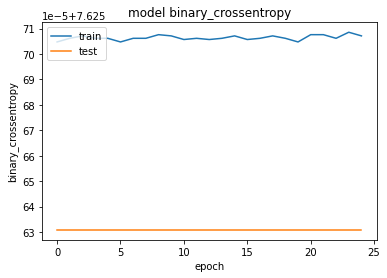

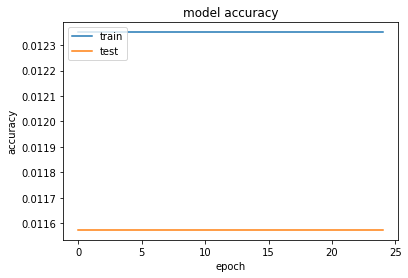

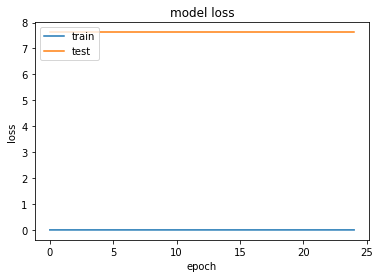

In [327]:
clear_all()
print(X_train_O.shape[1])
model = createModel(6, learning_rate=0.00001)
model = fit_model(model=model, class_weight=class_weight_O, X_train=X_train_O.iloc[:, :6], y_train=y_train_O, X_test=X_test_O, y_test=y_test_O, epochs=25, batch_size=25)

In [329]:
    
y_true = y_test_O
preds = model.predict(X_test_O.iloc[:, :6])
y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      3570
     class 1       0.01      1.00      0.02        38

    accuracy                           0.01      3608
   macro avg       0.01      0.50      0.01      3608
weighted avg       0.00      0.01      0.00      3608



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [260]:
under = RandomUnderSampler(sampling_strategy=0.5)
X, y = under.fit_resample(X_train_O, y_train_O)

## Try to use Bayessian optimization

In [ ]:
def fit_with(input_shape, verbose, dropout2_rate, lr):

    # Create the model using a specified hyperparameters.
    model = get_model(input_shape, dropout2_rate)

    # Train the model for a specified number of epochs.
    optimizer = rmsprop.RMSProp(learning_rate=lr)
    model.compile(loss=tf.keras.losses.categorical_crossentropy,
                  optimizer=optimizer,
                  metrics=['accuracy'])

    # Train the model with the train dataset.
    model.fit(x=train_ds, epochs=1, steps_per_epoch=468,
              batch_size=64, verbose=verbose)

    # Evaluate the model with the eval dataset.
    score = model.evaluate(eval_ds, steps=10, verbose=0)
    print('Test loss:', score[0])
    print('Test accuracy:', score[1])

    # Return the accuracy.

    return score[1]

from functools import partial

verbose = 1
fit_with_partial = partial(fit_with, input_shape, verbose)

In [ ]:
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
pbounds = {'dropout2_rate': (0.1, 0.5), 'lr': (1e-4, 1e-2)}

optimizer = BayesianOptimization(
    f=fit_with_partial,
    pbounds=pbounds,
    verbose=2,  # verbose = 1 prints only when a maximum is observed, verbose = 0 is silent
    random_state=1,
)

optimizer.maximize(init_points=10, n_iter=10,)


for i, res in enumerate(optimizer.res):
    print("Iteration {}: \n\t{}".format(i, res))

print(optimizer.max)

## Feature selection using tree based classifier

In [304]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier(n_estimators=50, verbose=1, n_jobs=14)
clf = clf.fit(X_train_O, y_train_O)
              

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=14)]: Using backend ThreadingBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done  22 tasks      | elapsed:    0.1s
[Parallel(n_jobs=14)]: Done  50 out of  50 | elapsed:    0.1s finished


In [305]:
clf.feature_importances_  

array([3.81859123e-04, 4.45974339e-04, 8.05245892e-01, 0.00000000e+00,
       7.97958076e-05, 1.72397208e-02, 4.54391984e-04, 7.47795371e-03,
       4.28909678e-04, 1.94252378e-04, 2.61526198e-04, 3.16185166e-04,
       3.48963473e-04, 8.03458120e-04, 1.07601358e-02, 4.77675792e-02,
       4.78547970e-02, 2.67777580e-04, 5.03322863e-04, 4.35694393e-04,
       2.19397608e-04, 1.58023697e-04, 0.00000000e+00, 2.56756732e-04,
       7.41541703e-05, 4.19770692e-04, 0.00000000e+00, 0.00000000e+00,
       7.21121527e-05, 0.00000000e+00, 2.94266709e-04, 1.81532478e-04,
       4.19177624e-04, 0.00000000e+00, 1.32040989e-04, 3.16076237e-04,
       5.71563273e-04, 0.00000000e+00, 0.00000000e+00, 6.59796481e-05,
       0.00000000e+00, 2.23142505e-04, 6.21024319e-05, 3.01104698e-04,
       0.00000000e+00, 1.17695640e-04, 1.73277816e-04, 8.25457678e-05,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       5.12612408e-04, 4.40062440e-04, 6.16177199e-04, 0.00000000e+00,
      

In [306]:
std = np.std([clf.feature_importances_ for tree in clf.estimators_], axis=0)

In [275]:
# model = SelectFromModel(clf, prefit=True)
# X_new = model.transform(X_train_O)
# X_new.shape 

(6116, 1)

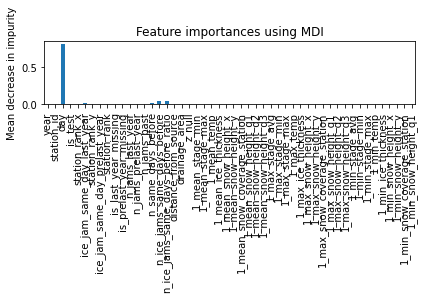

In [307]:
forest_importances = pd.Series(clf.feature_importances_  , X_train_O.columns)

fig, ax = plt.subplots()
forest_importances[:50].plot.bar(yerr=std[:50], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [312]:
y_true = y_test_O
preds = clf.predict(X_test_O)
# print(preds)
# y_pred = np.argmax(preds, axis=1)
y_pred = preds
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.00      0.00      0.00        38

    accuracy                           0.99      3608
   macro avg       0.49      0.50      0.50      3608
weighted avg       0.98      0.99      0.98      3608



[Parallel(n_jobs=14)]: Using backend ThreadingBackend with 14 concurrent workers.
[Parallel(n_jobs=14)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=14)]: Done  50 out of  50 | elapsed:    0.0s finished
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [308]:
forest_importances = pd.Series(clf.feature_importances_  , X_train_O.columns)

In [309]:
forest_importances[forest_importances > 0].sort_values(ascending=False)[:50]

day                                  0.805246
n_ice_jams_same_days_before_ratio    0.047855
n_ice_jams_same_days_before          0.047768
ice_jam_same_day_last_year           0.017240
n_same_days_before                   0.010760
ice_jam_same_day_prelast_year        0.007478
7_std_stage_min                      0.001100
n_jams_past                          0.000803
10_max_stage_min                     0.000685
10_std_temp                          0.000665
10_std_snow_height_x                 0.000662
7_std_stage_max                      0.000655
10_mean_snow_coverage_station        0.000646
1_std_stage_max                      0.000616
12_max_snow_height_y                 0.000604
7_max_temp                           0.000597
7_std_stage_avg                      0.000589
12_std_snow_height_y                 0.000587
1_max_snow_height_y                  0.000572
11_mean_snow_coverage_station        0.000521
12_min_ice_thickness                 0.000517
1_std_stage_avg                   

In [298]:
the_most_important_features = list(forest_importances[forest_importances > 0].sort_values(ascending=False)[:20].index)

In [302]:
X_train_most_imp_features = X_train[the_most_important_features]

Text(0.5, 1.05, 'Pearson correlation of the features')

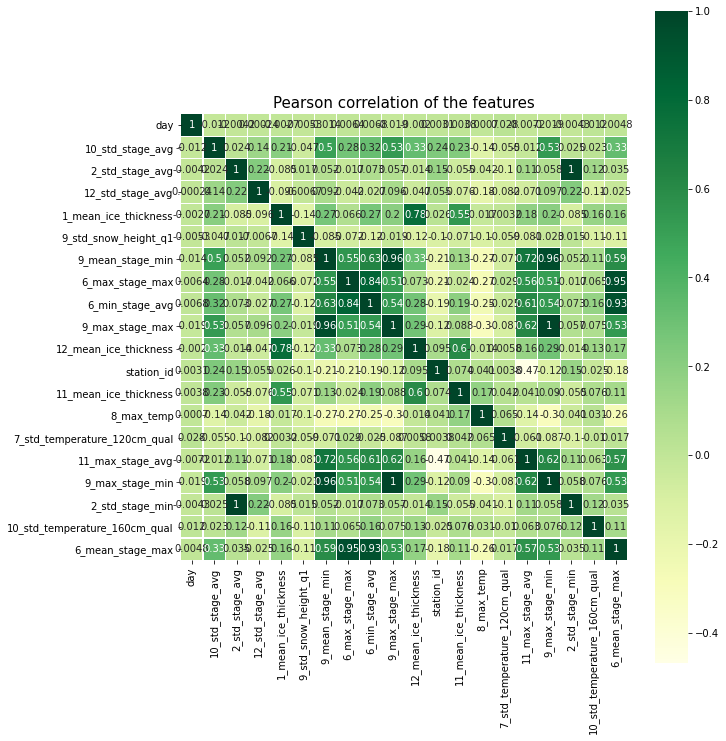

In [303]:
corr = X_train_most_imp_features.corr()

f, ax = plt.subplots(figsize=(10, 12))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
_ = sns.heatmap(corr, cmap="YlGn", square=True, ax=ax, annot=True, linewidth=0.1)
plt.title('Pearson correlation of the features', y=1.05, size=15)

## Train Neural Network with preprocessed data

In [175]:
def createModel3(learning_rate, dense_cells_1, dense_cells_2, dropout, num_of_features):

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(num_of_features, ), dtype='int32'),
        tf.keras.layers.Dense(dense_cells_1, activation=tf.nn.relu),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(dense_cells_2, activation=tf.nn.relu),
        tf.keras.layers.Dropout(dropout),
        tf.keras.layers.Dense(2, activation=tf.nn.softmax)
    ])

    model.build(input_shape=(None, num_of_features))

    model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

    print(model.summary())
    return model

In [178]:
for column_name in list(X_train_best.columns):
#     print(column_name)
    print(X_train_best[column_name].dtypes.name)

int64
int64
int64
bool
int64
float64
float64
float64
float64
bool
bool
float64
float64
float64
int64
float64
float64
float64
int64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float

In [179]:
replace_all_bool_and_int_to_float(X_train_best)
replace_all_bool_and_int_to_float(X_test_best)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 8)                 15720     
_________________________________________________________________
dropout (Dropout)            (None, 8)                 0         
_________________________________________________________________
dense_1 (Dense)              (None, 4)                 36        
_________________________________________________________________
dropout_1 (Dropout)          (None, 4)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 10        
Total params: 15,766
Trainable params: 15,766
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/25
181/181 [==============================] - 2s 9ms/step - loss: 0.0026 - binary_crossentropy: 7.3255 - 

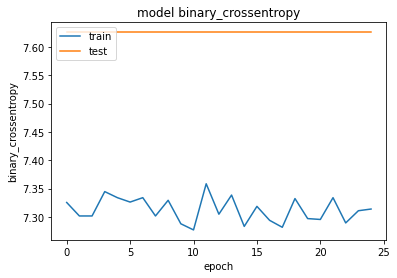

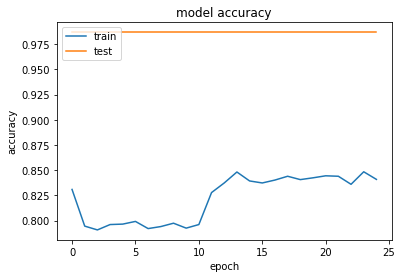

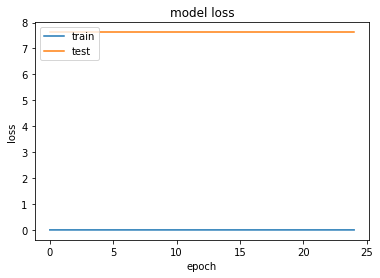

Model trained with dense_1 = 8, dense_2 = 4, dropout=0.2
              precision    recall  f1-score   support

     class 0       0.99      1.00      0.99      3570
     class 1       0.00      0.00      0.00        38

    accuracy                           0.99      3608
   macro avg       0.49      0.50      0.50      3608
weighted avg       0.98      0.99      0.98      3608



Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [185]:
dense_1, dense_2, dropout = 8, 4, 0.2

clear_all()
model = createModel3(0.0001, dense_1, dense_2, dropout, X_train_best.shape[1])
model = fit_model(model, 25, 25, class_weight, X_train_best, y_train_best)
print(f"Model trained with dense_1 = {dense_1}, dense_2 = {dense_2}, dropout={dropout}")
y_true = y_test_best
preds = model.predict(X_test_best)
y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

## Try LSTM

In [211]:
X_train_best = X_train_best.sort_values(['station_id', 'year', 'day'])

In [220]:
def create_lstm(num_of_features, learning_rate, x_train):
    model = tf.keras.Sequential()
    model.add(CuDNNLSTM(units=2, return_sequences=True, input_shape = (x_train.shape[1],1) ))
    model.add(Dropout(0.3))
    model.add(CuDNNLSTM(units=2, return_sequences=True,))
#     model.add(Dropout(0.2))
#     model.add(CuDNNLSTM(units=2))
#     model.add(Dropout(0.2))

#     model.add(LSTM(units= 30 , return_sequences=True))
#     model.add(Dropout(0.2))
#     model.add(LSTM(units= 30))
#     model.add(Dropout(0.2))
    
    
    model.add(Activation('relu'))

    model.compile(loss='binary_crossentropy', optimizer=tf.optimizers.Adam(lr=learning_rate), metrics=['binary_crossentropy', 'acc'])

#     print(model.summary())
    return model

In [221]:
clear_all()
X_train_lstm=X_train_best.to_numpy().reshape(X_train_best.shape[0],X_train_best.shape[1],1)
print(X_train_lstm.shape)


model = create_lstm(X_train_lstm.shape[1],0.0000001,  X_train_lstm)
print("FIT model")
model = fit_model(model, 25, 100, class_weight, X_train_lstm[:2], y_train_best[:2])

(5642, 1964, 1)


NameError: name 'SpatialDropout' is not defined

In [ ]:
# regressor = Sequential()
# regressor.add(Bidirectional(LSTM(units=30, return_sequences=True, input_shape = (x_train.shape[1],1) ) ))
# regressor.add(Dropout(0.2))
# regressor.add(LSTM(units= 30 , return_sequences=True))
# regressor.add(Dropout(0.2))
# regressor.add(LSTM(units= 30 , return_sequences=True))
# regressor.add(Dropout(0.2))
# regressor.add(LSTM(units= 30))
# regressor.add(Dropout(0.2))
# regressor.add(Dense(units = n_future,activation='linear'))
# regressor.compile(optimizer='adam', loss='mean_squared_error',metrics=['acc'])
# regressor.fit(x_train, y_train, epochs=500,batch_size=32 )

In [ ]:
X_test_lstm=X_test_best.to_numpy().reshape(X_test_best.shape[0],X_test_best.shape[1],1)
_true = y_test_best

In [219]:

preds = model.predict(X_test_lstm)
y_pred = np.argmax(preds, axis=1)
target_names = ['class 0', 'class 1']
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

     class 0       0.00      0.00      0.00      3570
     class 1       0.01      1.00      0.02        38

    accuracy                           0.01      3608
   macro avg       0.01      0.50      0.01      3608
weighted avg       0.00      0.01      0.00      3608

